<a href="https://colab.research.google.com/github/alfanashfak2001/Analysis/blob/main/CDR_churn_prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
# Load the dataset
data = pd.read_csv('generated_CDR_dataset.csv')

In [ ]:
data

,CallStart,CallEnd,Duration,CallerNumber,RecipientNumber,CallType,CallStatus,CallCost,CallLocation,Roaming,CallHandover,CallQuality,CallID,DeviceType,FraudActivity
0,2022-01-31 15:49:00,2022-01-12 01:07:00,364,5965473531,4072103018,Data,Busy,1.75,CellTower9,Yes,Yes,Excellent,1,FeaturePhone,1
1,2022-01-17 22:11:00,2022-01-20 19:53:00,71,7592874130,3170649266,SMS,Missed,0.42,CellTower9,No,No,Excellent,2,FeaturePhone,0
2,2022-01-16 15:08:00,2022-01-08 06:10:00,147,3543308132,4356923202,Voice,Busy,0.39,CellTower4,Yes,No,Good,3,Smartphone,0
3,2022-01-13 22:47:00,2022-01-24 18:07:00,75,8829321919,9856555540,Data,Missed,2.38,CellTower8,No,No,Excellent,4,FeaturePhone,1
4,2022-01-14 03:15:00,2022-01-30 02:33:00,321,8295407939,1999582015,SMS,Busy,1.80,CellTower4,No,Yes,Excellent,5,Tablet,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2022-01-16 18:53:00,2022-01-15 08:24:00,267,4528741977,8088512954,SMS,Busy,1.56,CellTower10,No,Yes,Excellent,996,FeaturePhone,1
996,2022-01-05 03:37:00,2022-01-18 11:37:00,402,1393134028,4495791905,Voice,Missed,0.21,CellTower1,Yes,No,Good,997,Tablet,0
997,2022-01-26 15:09:00,2022-01-12 10:02:00,416,2649412190,8931020362,SMS,Busy,0.28,CellTower7,Yes,Yes,Good,998,FeaturePhone,1
998,2022-01-19 05:10:00,2022-01-15 03:16:00,134,5644970909,3647507020,SMS,Answered,1.37,CellTower6,No,Yes,Good,999,Smartphone,0


In [ ]:
data.columns

Index(['CallStart', 'CallEnd', 'Duration', 'CallerNumber', 'RecipientNumber',
       'CallType', 'CallStatus', 'CallCost', 'CallLocation', 'Roaming',
       'CallHandover', 'CallQuality', 'CallID', 'DeviceType', 'FraudActivity'],
      dtype='object')

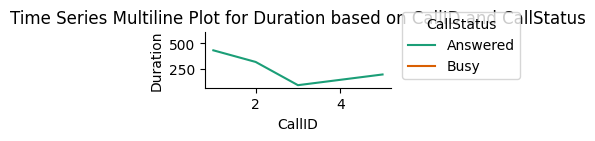

In [ ]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

# Assuming df is the DataFrame containing the previous dataset
# Example dataset for demonstration:
data = {
    'CallID': [1, 2, 3, 4, 5],
    'Duration': [432, 318, 90, 590, 195],
    'CallStatus': ['Answered', 'Answered', 'Answered', 'Busy', 'Answered']
}
df = pd.DataFrame(data)

def time_series_multiline(df, timelike_colname, value_colname, series_colname=None, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
    palette = list(sns.palettes.mpl_palette(mpl_palette_name))

    def _plot_series(series, series_name, series_index=0):
        xs = series[timelike_colname]
        ys = series[value_colname]
        plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

    fig, ax = plt.subplots(figsize=figsize, constrained_layout=True)
    df = df.sort_values(timelike_colname, ascending=True)
    if series_colname:
        for i, (series_name, series) in enumerate(df.groupby(series_colname)):
            _plot_series(series, series_name, i)
        fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
    else:
        _plot_series(df, '')
    sns.despine(fig=fig, ax=ax)
    plt.xlabel(timelike_colname)
    plt.ylabel(value_colname)
    return plt

# Example usage:
chart = time_series_multiline(df, 'CallID', 'Duration', 'CallStatus')
plt.title('Time Series Multiline Plot for Duration based on CallID and CallStatus')
plt.show()


In [ ]:
import numpy as np
from google.colab import autoviz
df_3962831333079578440 = autoviz.get_df('df_3962831333079578440')

def scatter_plots(df, colname_pairs, scatter_plot_size=2.5, size=8, alpha=.6):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * scatter_plot_size, scatter_plot_size))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    ax.scatter(df[x_colname], df[y_colname], s=size, alpha=alpha)
    plt.xlabel(x_colname)
    plt.ylabel(y_colname)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df_3962831333079578440, *[[['Duration', 'CallerNumber'], ['CallerNumber', 'RecipientNumber'], ['RecipientNumber', 'CallCost'], ['CallCost', 'CallID']]], **{})
chart

In [ ]:
# Select the categorical columns to encode
# Perform label encoding
encoder = LabelEncoder()

data['Churn'] = encoder.fit_transform(data['Churn'])

In [ ]:
# Separate the features (X) and the target variable (y)
X = data.drop('Churn', axis=1)
X = X.drop('Phone Number',axis=1)
y = data['Churn']  # Replace with churn column

In [ ]:
X


,Account Length,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Local call minutes,Local call charge,Local call count
0,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,707.2,72.86,300
1,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,611.5,55.54,329
2,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,527.2,59.00,328
3,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,558.2,65.02,248
4,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,501.9,49.36,356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7462,222,0,223.2,226,20.23,229.3,92,22.29,222.0,36,20.22,23.6,3,3.62,3,674.5,62.74,354
7463,29,0,232.2,93,22.90,239.2,63,26.22,222.2,223,9.96,22.3,3,3.29,2,693.6,59.08,379
7464,63,0,232.2,32,39.29,233.2,33,23.02,292.3,223,3.62,9.6,2,2.39,3,757.7,65.93,288
7465,23,0,230.3,209,30.22,233.3,33,22.33,292.9,92,3.62,22.2,6,3.32,2,756.5,56.17,334


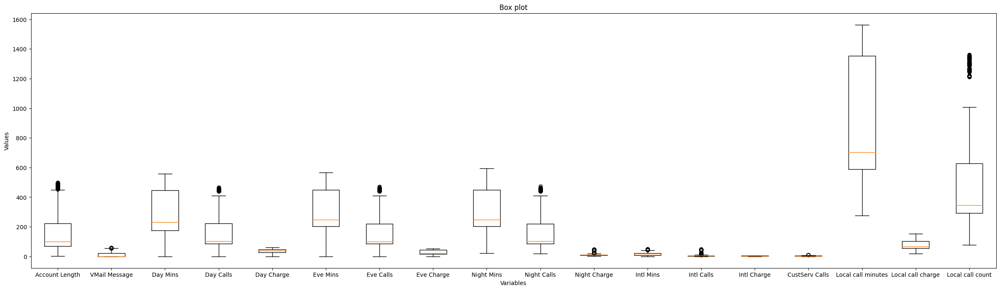

In [ ]:
# Create the multi-box plot
plt.figure(figsize=(30, 8))
plt.boxplot(X, labels=X.columns)

# Add labels and title
plt.xlabel('Variables')
plt.ylabel('Values')
plt.title('Box plot')

# Display the plot
plt.show()

In [ ]:
X.var()

Account Length         21301.355799
VMail Message            313.107684
Day Mins               19639.666697
Day Calls              18981.986981
Day Charge               156.867000
Eve Mins               16971.902775
Eve Calls              18807.317638
Eve Charge               195.553418
Night Mins             16992.049496
Night Calls            18773.936223
Night Charge             148.935275
Intl Mins                207.894899
Intl Calls                27.570237
Intl Charge                1.553279
CustServ Calls             2.899006
Local call minutes    137372.327980
Local call charge        959.783591
Local call count       90928.006016
dtype: float64

In [ ]:
X.std()

Account Length        145.949840
VMail Message          17.694849
Day Mins              140.141595
Day Calls             137.775132
Day Charge             12.524656
Eve Mins              130.276256
Eve Calls             137.139774
Eve Charge             13.984042
Night Mins            130.353556
Night Calls           137.018014
Night Charge           12.203904
Intl Mins              14.418561
Intl Calls              5.250737
Intl Charge             1.246306
CustServ Calls          1.702647
Local call minutes    370.637731
Local call charge      30.980374
Local call count      301.542710
dtype: float64

In [ ]:
X.head(5)

,Account Length,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Local call minutes,Local call charge,Local call count
0,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,707.2,72.86,300
1,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,611.5,55.54,329
2,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,527.2,59.00,328
3,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,558.2,65.02,248
4,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,501.9,49.36,356


In [ ]:
X.var()

Account Length         21301.355799
VMail Message            313.107684
Day Mins               19639.666697
Day Calls              18981.986981
Day Charge               156.867000
Eve Mins               16971.902775
Eve Calls              18807.317638
Eve Charge               195.553418
Night Mins             16992.049496
Night Calls            18773.936223
Night Charge             148.935275
Intl Mins                207.894899
Intl Calls                27.570237
Intl Charge                1.553279
CustServ Calls             2.899006
Local call minutes    137372.327980
Local call charge        959.783591
Local call count       90928.006016
dtype: float64

In [ ]:
y.var()

0.12363806947551101

In [ ]:
y.head(5)

0    0
1    0
2    0
3    0
4    0
Name: Churn, dtype: int64

In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Perform PCA
pca = PCA(n_components=2)  # Specify the number of components to keep
X_train_pca = pca.fit_transform(X_train_scaled)
X_test_pca = pca.transform(X_test_scaled)

In [ ]:
component_names = list(X.columns)  # Use the actual column names as component names

# Print the explained variance ratio with column names
explained_variance_ratio = pca.explained_variance_ratio_
for i, ratio in enumerate(explained_variance_ratio):
    print(f"Principal Component {i+1} ({component_names[i]}): {ratio:.4f}")

Principal Component 1 (Account Length): 0.5188
Principal Component 2 (VMail Message): 0.0596


In [ ]:
# Create a classifier
classifier = LogisticRegression()

# Fit the classifier on the training data
classifier.fit(X_train_pca, y_train)
0
# Make predictions on the testing data
y_pred = classifier.predict(X_test_pca)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8493975903614458


In [ ]:
# Create a KNN classifier
knn = KNeighborsClassifier(n_neighbors=9)  # Specify the number of neighbors (k)

# Fit the classifier on the training data
knn.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = knn.predict(X_test)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8547523427041499


In [ ]:
# Create a KNN classifier
knn = KNeighborsClassifier(n_neighbors=5)  # Specify the number of neighbors (k)

# Fit the classifier on the training data
knn.fit(X_train, y_train)

# Make predictions on the testing data
y_pred = knn.predict(X_test)

# Evaluate the classifier
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.8493975903614458


In [ ]:
# Create a Logistic Regression model
model = LogisticRegression()

In [ ]:
# Fit the model on the training data
model.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [ ]:
# Make predictions on the testing data
y_pred = model.predict(X_test)

In [ ]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
confusion_mat = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:")
print(confusion_mat)
print("Classification Report:")
print(classification_rep)


Accuracy: 0.8493975903614458
Precision: 0.0
Recall: 0.0
F1 Score: 0.0
Confusion Matrix:
[[1269    0]
 [ 225    0]]
Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      1269
           1       0.00      0.00      0.00       225

    accuracy                           0.85      1494
   macro avg       0.42      0.50      0.46      1494
weighted avg       0.72      0.85      0.78      1494



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Unde

In [ ]:
# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [ ]:
# Perform PCA
pca = PCA(n_components=2)  # Specify the number of components to keep
X_pca = pca.fit_transform(X_scaled)


In [ ]:
component_names = list(X.columns)  # Use the actual column names as component names

# Print the explained variance ratio with column names
explained_variance_ratio = pca.explained_variance_ratio_
for i, ratio in enumerate(explained_variance_ratio):
    print(f"Principal Component {i+1} ({component_names[i]}): {ratio:.4f}")

Principal Component 1 (Account Length): 0.5188
Principal Component 2 (VMail Message): 0.0611


In [ ]:
# Create a new DataFrame with the PCA results
pca_df = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
pca_df.head(5)

,PC1,PC2
0,-1.710574,0.720205
1,-2.203611,0.184257
2,-2.587919,-0.044927
3,-2.771065,0.480275
4,-2.844068,-0.423899


In [ ]:
# Print the explained variance ratio
print("Explained Variance Ratio:", pca.explained_variance_ratio_)

# Print the transformed data
print(pca_df.head())

Explained Variance Ratio: [0.51882287 0.06111428]
        PC1       PC2
0 -1.710574  0.720205
1 -2.203611  0.184257
2 -2.587919 -0.044927
3 -2.771065  0.480275
4 -2.844068 -0.423899


In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(pca_df, y, test_size=0.2, random_state=42)

In [ ]:
X_test.head(5)

,PC1,PC2
5075,4.466919,0.519542
4746,3.750068,-1.029746
1372,-3.630917,-0.166007
3298,-3.361536,-0.538849
1041,-1.517387,0.564407


In [ ]:
model = LogisticRegression()

In [ ]:
# Fit the model on the training data
model.fit(X_train, y_train)

LogisticRegression()

In [ ]:
# Make predictions on the testing data
y_pred = model.predict(X_test)

In [ ]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
confusion_mat = confusion_matrix(y_test, y_pred)
classification_rep = classification_report(y_test, y_pred)

print("Accuracy:", accuracy)
print("Precision:", precision)
print("Recall:", recall)
print("F1 Score:", f1)
print("Confusion Matrix:")
print(confusion_mat)
print("Classification Report:")
print(classification_rep)

Accuracy: 0.8493975903614458
Precision: 0.0
Recall: 0.0
F1 Score: 0.0
Confusion Matrix:
[[1269    0]
 [ 225    0]]
Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      1269
           1       0.00      0.00      0.00       225

    accuracy                           0.85      1494
   macro avg       0.42      0.50      0.46      1494
weighted avg       0.72      0.85      0.78      1494



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: Unde

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7467 entries, 0 to 7466
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Phone Number        7467 non-null   object 
 1   Account Length      7467 non-null   int64  
 2   VMail Message       7467 non-null   int64  
 3   Day Mins            7467 non-null   float64
 4   Day Calls           7467 non-null   int64  
 5   Day Charge          7467 non-null   float64
 6   Eve Mins            7467 non-null   float64
 7   Eve Calls           7467 non-null   int64  
 8   Eve Charge          7467 non-null   float64
 9   Night Mins          7467 non-null   float64
 10  Night Calls         7467 non-null   int64  
 11  Night Charge        7467 non-null   float64
 12  Intl Mins           7467 non-null   float64
 13  Intl Calls          7467 non-null   int64  
 14  Intl Charge         7467 non-null   float64
 15  CustServ Calls      7467 non-null   int64  
 16  Churn 

In [ ]:
data.describe()

,Account Length,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn,Local call minutes,Local call charge,Local call count
count,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000
mean,168.991027,10.286996,285.289728,172.567430,37.245713,304.285871,169.654078,28.541452,304.431150,170.511049,13.543290,17.840364,5.164725,3.568208,2.285121,0.144502,894.006750,79.330455,512.732557
std,145.949840,17.694849,140.141595,137.775132,12.524656,130.276256,137.139774,13.984042,130.353556,137.018014,12.203904,14.418561,5.250737,1.246306,1.702647,0.351622,370.637731,30.980374,301.542710
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.600000,20.000000,1.040000,0.000000,0.000000,0.000000,0.000000,0.000000,275.200000,19.980000,77.000000
25%,70.000000,0.000000,175.900000,87.000000,26.820000,203.200000,86.000000,17.140000,203.200000,86.000000,7.215000,8.400000,3.000000,2.540000,1.000000,0.000000,587.650000,54.900000,292.000000
50%,101.000000,0.000000,232.200000,102.000000,37.010000,248.500000,101.000000,22.690000,247.000000,102.000000,9.040000,10.800000,4.000000,3.320000,2.000000,0.000000,704.100000,67.000000,345.000000
75%,222.000000,22.000000,446.700000,222.000000,46.850000,448.850000,220.000000,44.750000,448.500000,220.000000,11.500000,22.300000,6.000000,4.640000,4.000000,0.000000,1351.950000,102.625000,628.000000
max,499.000000,59.000000,557.400000,465.000000,59.980000,565.700000,470.000000,50.940000,595.000000,475.000000,47.770000,48.900000,49.000000,5.970000,9.000000,1.000000,1563.300000,153.810000,1362.000000


In [ ]:
data.groupby("Churn").mean()

<ipython-input-102-790ace64a157>:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  data.groupby("Churn").mean()


,Account Length,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Local call minutes,Local call charge,Local call count
Churn,,,,,,,,,,,,,,,,,,
0,168.512210,10.959455,282.056168,171.687070,36.983637,303.116828,169.505322,28.430236,303.664559,170.403100,13.496922,17.660864,5.186756,3.550510,2.219004,888.837555,78.910795,511.595492
1,171.825765,6.305839,304.433364,177.779425,38.797285,311.206951,170.534754,29.199880,308.969601,171.150139,13.817804,18.903058,5.034291,3.672984,2.676552,924.609917,81.814968,519.464319


In [ ]:
data.shape

(7467, 20)

In [ ]:
!pip install faker

In [ ]:
from faker import Faker
import pandas as pd
import random

# Instantiate Faker object
fake = Faker()

# Generate random call details records
size = 100  # Specify the size of the dataset

data = []
for _ in range(size):
    record = {
        'CallID': fake.uuid4(),
        'Caller': fake.phone_number(),
        'Recipient': fake.phone_number(),
        'CallDuration': random.randint(1, 60),
        'CallDateTime': fake.date_time_this_decade(),
        'CallLocation': fake.city()

    }
    data.append(record)

# Create DataFrame from the generated data
df = pd.DataFrame(data)
df


,CallID,Caller,Recipient,CallDuration,CallDateTime,CallLocation
0,cedcb2b0-a8be-449b-9923-0d31c1bcb413,(502)294-1481x69837,6586220407,2,2022-11-20 21:05:46,Amandamouth
1,5ccad5fd-ac6f-4c45-80f3-147d618b7b01,211.491.7481x3595,+1-946-748-0369x25442,51,2020-11-09 18:28:40,Rachelhaven
2,fbac8f26-8a01-4551-bc00-922f48cb5cf1,696-563-9284x87665,+1-969-804-1936x7676,60,2020-11-26 09:01:26,North Ashleytown
3,c4a05bdf-5cc7-4aa0-b32e-1b2f110773e7,+1-278-210-6411x090,652.763.2281x957,14,2023-02-05 17:18:30,South Bethanyshire
4,32464521-ae1a-4a42-802f-e7cf9f83d561,657.550.4323x1927,(706)975-2941,10,2020-02-22 00:10:06,Francoland
...,...,...,...,...,...,...
95,0eab6bd5-01c2-4cfe-998c-1fdd044ee7fc,884-645-2439,001-870-577-1647x96372,35,2021-07-31 11:12:03,Garciahaven
96,16a446a2-4379-4faa-8e79-a75526b12f07,+1-957-407-6302x32692,6229539474,29,2020-08-21 20:04:18,Port Lisaberg
97,c0494989-c055-4d5f-a7c8-b8cc9509408a,827-592-9145,596.649.6247x26768,33,2020-01-04 01:20:13,New Travisberg
98,8877508b-3ce0-4b27-805b-26877190c3b6,829-777-1762x3731,001-860-736-2658x06463,46,2022-11-14 16:03:13,West Kendra


In [ ]:
from faker import Faker
fake = Faker()
names = [fake.unique.first_name() for i in range(500)]
assert len(set(names)) == len(names)
names

['Jessica',
 'Ebony',
 'Wendy',
 'William',
 'Amy',
 'Cynthia',
 'Sonya',
 'Cindy',
 'Jane',
 'Ethan',
 'Nicholas',
 'Ashley',
 'Anthony',
 'Jonathon',
 'Julie',
 'Gary',
 'Chase',
 'Stanley',
 'Taylor',
 'George',
 'Travis',
 'Michael',
 'Lisa',
 'Melissa',
 'Andrew',
 'Calvin',
 'Shannon',
 'Sandra',
 'Karen',
 'Jesse',
 'Sonia',
 'Robert',
 'Theresa',
 'Eric',
 'Kimberly',
 'Paula',
 'Jonathan',
 'Aaron',
 'Jacqueline',
 'Chad',
 'Patricia',
 'Roger',
 'Matthew',
 'John',
 'Kevin',
 'Yvonne',
 'Tamara',
 'Bailey',
 'Ashlee',
 'Steven',
 'Jennifer',
 'Brian',
 'Patrick',
 'Jill',
 'Jose',
 'Daniel',
 'Kyle',
 'Kathy',
 'Gregory',
 'James',
 'Terry',
 'Joshua',
 'Barry',
 'Mark',
 'Nancy',
 'Christopher',
 'Mia',
 'Raymond',
 'Jeremy',
 'Diana',
 'Christina',
 'Joel',
 'Juan',
 'Brittany',
 'Frank',
 'Shawn',
 'Valerie',
 'Craig',
 'Ronald',
 'Laura',
 'Raven',
 'Mandy',
 'Richard',
 'Andrea',
 'Jacob',
 'Tom',
 'Crystal',
 'Thomas',
 'Brianna',
 'Kim',
 'Justin',
 'Jasmine',
 'Melani

In [ ]:

# Example dataset (five columns)
data = {
    'Column1': [10, 12, 14, 8, 11],
    'Column2': [15, 13, 17, 18, 16],
    'Column3': [22, 25, 20, 23, 24],
    'Column4': [9, 8, 7, 6, 10],
    'Column5': [30, 29, 28, 31, 27]
}

# Create a DataFrame from the dataset
df = pd.DataFrame(data)

# Calculate variance and standard deviation for each column
variances = df.var()
standard_deviations = df.std()

print("Variances:")
print(variances)

print("\nStandard Deviations:")
print(standard_deviations)


Variances:
Column1    5.0
Column2    3.7
Column3    3.7
Column4    2.5
Column5    2.5
dtype: float64

Standard Deviations:
Column1    2.236068
Column2    1.923538
Column3    1.923538
Column4    1.581139
Column5    1.581139
dtype: float64


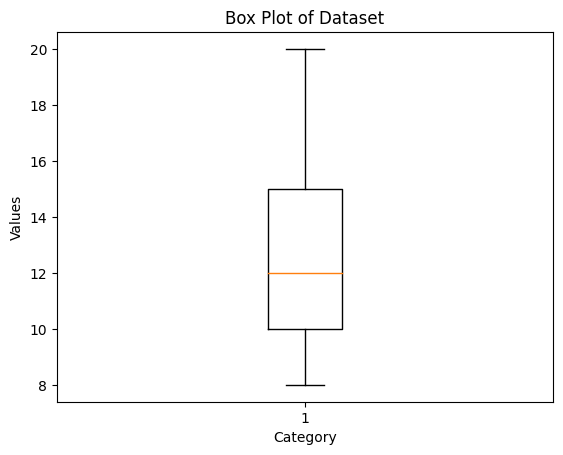

In [ ]:

# Example dataset
data = {
    'Category': ['A', 'B', 'C', 'D', 'E'],
    'Values': [10, 15, 8, 12, 20]
}

# Create a DataFrame from the dataset
df = pd.DataFrame(data)

# Extract the data for the plot
values = df['Values']

# Create the box plot
plt.boxplot(values)

# Add labels and title
plt.xlabel('Category')
plt.ylabel('Values')
plt.title('Box Plot of Dataset')

# Display the plot
plt.show()


In [ ]:
# # Example dataset (exam scores)
# data = [45, 60, 65, 70, 75, 78, 80, 82, 85, 90,62, 78, 85, 72, 90, 55, 68, 80, 77, 88, 92, 73, 81]
# data = sorted(data)

data = {'Values': [45, 55, 60, 62, 65, 68, 70, 72, 73, 75, 77, 78, 78, 80, 80, 81, 82, 85, 85, 88, 90, 90, 92]}

In [ ]:
print(data)

{'Values': [45, 55, 60, 62, 65, 68, 70, 72, 73, 75, 77, 78, 78, 80, 80, 81, 82, 85, 85, 88, 90, 90, 92]}


In [ ]:
df=pd.DataFrame(data)
df

,Values
0,45
1,55
2,60
3,62
4,65
5,68
6,70
7,72
8,73
9,75


In [ ]:
# Calculate Q1 and Q3 using NumPy
q1 = np.percentile(data["Values"], 25)
q2 = np.percentile(data["Values"], 50)
q3 = np.percentile(data["Values"], 75)

print("Dataset:", data)

print("Lower Quartile (Q1):", q1)
print("middle quartile(Q2)" , q2)
print("Upper Quartile (Q3):", q3)

Dataset: {'Values': [45, 55, 60, 62, 65, 68, 70, 72, 73, 75, 77, 78, 78, 80, 80, 81, 82, 85, 85, 88, 90, 90, 92]}
Lower Quartile (Q1): 69.0
middle quartile(Q2) 78.0
Upper Quartile (Q3): 83.5


In [ ]:
df=pd.DataFrame(data)
df

,0
0,45
1,55
2,60
3,62
4,65
5,68
6,70
7,72
8,73
9,75


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.
Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
df.describe()

,Values
count,23.000000
mean,75.260870
std,11.955286
min,45.000000
25%,69.000000
50%,78.000000
75%,83.500000
max,92.000000


import numpy as np
from google.colab import autoviz
df_6220604950757716590 = autoviz.get_registered_df('df_6220604950757716590')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_6220604950757716590, *['Values'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6220604950757716590 = autoviz.get_registered_df('df_6220604950757716590')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_6220604950757716590, *['Values'], **{})
chart

In [ ]:
import numpy as np
from google.colab import autoviz
df_6220604950757716590 = autoviz.get_registered_df('df_6220604950757716590')

def histogram(df, colname, num_bins=20, figsize=(8, 6)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_6220604950757716590, *['Values'], **{})
chart

In [ ]:
df["Values"].sum()/23

75.26086956521739

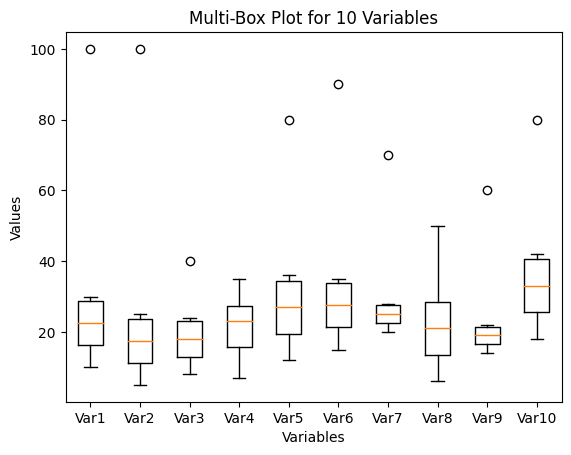

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Example DataFrame with 10 variables (columns)
data = {
    'Var1': [10, 15, 20, 25, 30, 100],
    'Var2': [5, 10, 15, 20, 25, 100],
    'Var3': [8, 12, 16, 20, 24, 40],
    'Var4': [7, 14, 21, 28, 35, 25],
    'Var5': [12, 18, 24, 30, 36, 80],
    'Var6': [15, 20, 25, 30, 35, 90],
    'Var7': [20, 22, 24, 26, 28, 70],
    'Var8': [6, 12, 18, 24, 30, 50],
    'Var9': [14, 16, 18, 20, 22, 60],
    'Var10': [18, 24, 30, 36, 42, 80]
}

df = pd.DataFrame(data)

# Create the multi-box plot
plt.boxplot(df.values, labels=df.columns)

# Add labels and title
plt.xlabel('Variables')
plt.ylabel('Values')
plt.title('Multi-Box Plot for 10 Variables')

# Display the plot
plt.show()


In [ ]:
!pip install matplotlib

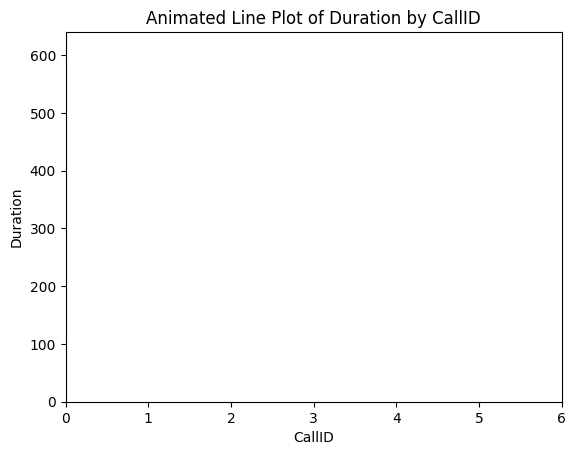

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

# Assuming df is the DataFrame containing the previous dataset
# Example dataset for demonstration:
data = {
    'Duration': [432, 318, 90, 590, 195],
    'CallID': [1, 2, 3, 4, 5]
}
df = pd.DataFrame(data)

# Sort the DataFrame by 'CallID'
df = df.sort_values('CallID')

# Create the figure and axis for the animated plot
fig, ax = plt.subplots()
ax.set_xlim(0, len(df['Duration']) + 1)
ax.set_ylim(0, df['Duration'].max() + 50)

# Initialize the line plot (empty plot)
line, = ax.plot([], [], lw=2)

# Function to update the plot for each frame of the animation
def update(frame):
    x = df['CallID'].values[:frame + 1]  # CallID values up to the current frame
    y = df['Duration'].values[:frame + 1]  # Duration values up to the current frame
    line.set_data(x, y)
    return line,

# Create the animation
animation = FuncAnimation(fig, update, frames=len(df), interval=100, blit=True)

# Display the animation
plt.title('Animated Line Plot of Duration by CallID')
plt.xlabel('CallID')
plt.ylabel('Duration')
plt.show()


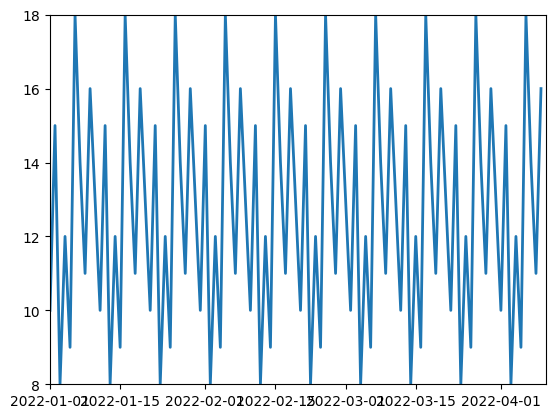

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Assuming df is the DataFrame containing your dataset
# Example dataset for demonstration:
data = {
    'Timestamp': pd.date_range('2022-01-01', periods=100, freq='D'),
    'Value': [10, 15, 8, 12, 9, 18, 14, 11, 16, 13,10, 15, 8, 12, 9, 18, 14, 11, 16, 13,10, 15, 8, 12, 9, 18, 14, 11, 16, 13,10, 15, 8, 12, 9, 18, 14, 11, 16, 13,10, 15, 8, 12, 9, 18, 14, 11, 16, 13,10, 15, 8, 12, 9, 18, 14, 11, 16, 13,10, 15, 8, 12, 9, 18, 14, 11, 16, 13,10, 15, 8, 12, 9, 18, 14, 11, 16, 13,10, 15, 8, 12, 9, 18, 14, 11, 16, 13,10, 15, 8, 12, 9, 18, 14, 11, 16, 13]
}
df = pd.DataFrame(data)

# Create the figure and axes for the plot
fig, ax = plt.subplots()
ax.set_xlim(df['Timestamp'].min(), df['Timestamp'].max())
ax.set_ylim(df['Value'].min(), df['Value'].max())
line, = ax.plot([], [], lw=2)

# Update function for the animation
def update(frame):
    line.set_data(df['Timestamp'][:frame], df['Value'][:frame])
    return line,

# Animation function
def animate():
    animation = FuncAnimation(fig, update, frames=len(df), interval=500, blit=True)
    return animation.to_jshtml()

# Call the animation function
HTML(animate())


In [ ]:
import pandas as pd
import random
import datetime

# Generate random data for each column
def generate_data(n_rows):
    data = {
        'CallStart': [datetime.datetime(2022, 1, random.randint(1, 31), random.randint(0, 23), random.randint(0, 59)) for _ in range(n_rows)],
        'CallEnd': [datetime.datetime(2022, 1, random.randint(1, 31), random.randint(0, 23), random.randint(0, 59)) for _ in range(n_rows)],
        'Duration': [random.randint(60, 600) for _ in range(n_rows)],  # Random duration in seconds (1 to 10 minutes)
        'CallerNumber': [random.randint(1000000000, 9999999999) for _ in range(n_rows)],
        'RecipientNumber': [random.randint(1000000000, 9999999999) for _ in range(n_rows)],
        'CallType': [random.choice(['Voice', 'Data', 'SMS']) for _ in range(n_rows)],
        'CallStatus': [random.choice(['Answered', 'Busy', 'Missed']) for _ in range(n_rows)],
        'CallCost': [round(random.uniform(0.1, 2.5), 2) for _ in range(n_rows)],
        'CallLocation': [f'CellTower{random.randint(1, 10)}' for _ in range(n_rows)],
        'Roaming': [random.choice(['Yes', 'No']) for _ in range(n_rows)],
        'CallHandover': [random.choice(['Yes', 'No']) for _ in range(n_rows)],
        'CallQuality': [random.choice(['Good', 'Poor', 'Excellent']) for _ in range(n_rows)],
        'CallID': list(range(1, n_rows + 1)),
        'DeviceType': [random.choice(['Smartphone', 'FeaturePhone', 'Tablet']) for _ in range(n_rows)],
        'FraudActivity': [random.choice([0, 1]) for _ in range(n_rows)]  # 0 for no fraud, 1 for fraud
    }
    return data

# Generate the dataset with 1000 rows
dataset = pd.DataFrame(generate_data(1000))

# Display the dataset



In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import random

# Assuming df is the DataFrame containing your dataset
date = dataset["CallStart"].tolist()
duration = dataset["Duration"].tolist()
date = sorted(date)


data = {
    'Timestamp': date,
    'Value': duration
}

df = pd.DataFrame(data)

# Create the figure and axes for the plot
fig, ax = plt.subplots(figsize=(10,8))
ax.set_xlim(df['Timestamp'].min(), df['Timestamp'].max())
ax.set_ylim(df['Value'].min(), df['Value'].max())
line, = ax.plot([], [], lw=0.1, color="Red")

# Update function for the animation
def update(frame):
    line.set_data(df['Timestamp'][:frame], df['Value'][:frame])
    return line,

# Animation function
def animate():
    plt.rcParams['animation.embed_limit'] = 100.0  # For example, set to 100 MB
    animation = FuncAnimation(fig, update, frames=len(df), interval=500, blit=True)
    return animation.to_jshtml()

# Call the animation function
HTML(animate())


In [ ]:
file_path = 'generated_CDR_dataset.csv'
dataset.to_csv(file_path, index=False)

In [ ]:
dataset

,CallStart,CallEnd,Duration,CallerNumber,RecipientNumber,CallType,CallStatus,CallCost,CallLocation,Roaming,CallHandover,CallQuality,CallID,DeviceType,FraudActivity
0,2022-01-31 15:49:00,2022-01-12 01:07:00,364,5965473531,4072103018,Data,Busy,1.75,CellTower9,Yes,Yes,Excellent,1,FeaturePhone,1
1,2022-01-17 22:11:00,2022-01-20 19:53:00,71,7592874130,3170649266,SMS,Missed,0.42,CellTower9,No,No,Excellent,2,FeaturePhone,0
2,2022-01-16 15:08:00,2022-01-08 06:10:00,147,3543308132,4356923202,Voice,Busy,0.39,CellTower4,Yes,No,Good,3,Smartphone,0
3,2022-01-13 22:47:00,2022-01-24 18:07:00,75,8829321919,9856555540,Data,Missed,2.38,CellTower8,No,No,Excellent,4,FeaturePhone,1
4,2022-01-14 03:15:00,2022-01-30 02:33:00,321,8295407939,1999582015,SMS,Busy,1.80,CellTower4,No,Yes,Excellent,5,Tablet,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2022-01-16 18:53:00,2022-01-15 08:24:00,267,4528741977,8088512954,SMS,Busy,1.56,CellTower10,No,Yes,Excellent,996,FeaturePhone,1
996,2022-01-05 03:37:00,2022-01-18 11:37:00,402,1393134028,4495791905,Voice,Missed,0.21,CellTower1,Yes,No,Good,997,Tablet,0
997,2022-01-26 15:09:00,2022-01-12 10:02:00,416,2649412190,8931020362,SMS,Busy,0.28,CellTower7,Yes,Yes,Good,998,FeaturePhone,1
998,2022-01-19 05:10:00,2022-01-15 03:16:00,134,5644970909,3647507020,SMS,Answered,1.37,CellTower6,No,Yes,Good,999,Smartphone,0


import numpy as np
from google.colab import autoviz
df_7288101428436660130 = autoviz.get_df('df_7288101428436660130')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_7288101428436660130, *['Duration'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2830337789654443415 = autoviz.get_df('df_2830337789654443415')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_2830337789654443415, *['CallerNumber'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8090327227417941195 = autoviz.get_df('df_8090327227417941195')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_8090327227417941195, *['RecipientNumber'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6649578338697916105 = autoviz.get_df('df_6649578338697916105')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_6649578338697916105, *['CallCost'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4681884904197765313 = autoviz.get_df('df_4681884904197765313')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_4681884904197765313, *['Duration'], **{})
chart

import numpy as np
from google.colab import autoviz
df_320994960872371188 = autoviz.get_df('df_320994960872371188')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_320994960872371188, *['CallerNumber'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2676517242092796832 = autoviz.get_df('df_2676517242092796832')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_2676517242092796832, *['RecipientNumber'], **{})
chart

import numpy as np
from google.colab import autoviz
df_5833034856116168690 = autoviz.get_df('df_5833034856116168690')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_5833034856116168690, *['CallCost'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8209451463420010001 = autoviz.get_df('df_8209451463420010001')

def categorical_histogram(df, colname, figsize=(2, 1.2), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  _, ax = plt.subplots(figsize=figsize)
  bars = df[colname].value_counts()
  plt.barh(bars.index, bars.values, color=sns.palettes.mpl_palette(mpl_palette_name))
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(df_8209451463420010001, *['CallType'], **{})
chart

import numpy as np
from google.colab import autoviz
df_1741414536492316905 = autoviz.get_df('df_1741414536492316905')

def categorical_histogram(df, colname, figsize=(2, 1.2), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  _, ax = plt.subplots(figsize=figsize)
  bars = df[colname].value_counts()
  plt.barh(bars.index, bars.values, color=sns.palettes.mpl_palette(mpl_palette_name))
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(df_1741414536492316905, *['CallStatus'], **{})
chart

import numpy as np
from google.colab import autoviz
df_7152513508318311910 = autoviz.get_df('df_7152513508318311910')

def categorical_histogram(df, colname, figsize=(2, 1.2), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  _, ax = plt.subplots(figsize=figsize)
  bars = df[colname].value_counts()
  plt.barh(bars.index, bars.values, color=sns.palettes.mpl_palette(mpl_palette_name))
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(df_7152513508318311910, *['Roaming'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8117249599541010745 = autoviz.get_df('df_8117249599541010745')

def categorical_histogram(df, colname, figsize=(2, 1.2), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  _, ax = plt.subplots(figsize=figsize)
  bars = df[colname].value_counts()
  plt.barh(bars.index, bars.values, color=sns.palettes.mpl_palette(mpl_palette_name))
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(df_8117249599541010745, *['CallHandover'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8388220906764667583 = autoviz.get_df('df_8388220906764667583')

def scatter_plots(df, colname_pairs, scatter_plot_size=2.5, size=8, alpha=.6):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * scatter_plot_size, scatter_plot_size))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    ax.scatter(df[x_colname], df[y_colname], s=size, alpha=alpha)
    plt.xlabel(x_colname)
    plt.ylabel(y_colname)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df_8388220906764667583, *[[['Duration', 'CallerNumber'], ['CallerNumber', 'RecipientNumber'], ['RecipientNumber', 'CallCost'], ['CallCost', 'CallID']]], **{})
chart

import numpy as np
from google.colab import autoviz
df_6978612625531049118 = autoviz.get_df('df_6978612625531049118')

def heatmap(df, x_colname, y_colname, figsize=(2, 2), mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=figsize)
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(df_6978612625531049118, *['CallType', 'CallStatus'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8389149866910706085 = autoviz.get_df('df_8389149866910706085')

def heatmap(df, x_colname, y_colname, figsize=(2, 2), mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=figsize)
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(df_8389149866910706085, *['CallStatus', 'Roaming'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4037851760710672342 = autoviz.get_df('df_4037851760710672342')

def heatmap(df, x_colname, y_colname, figsize=(2, 2), mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=figsize)
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(df_4037851760710672342, *['Roaming', 'CallHandover'], **{})
chart

import numpy as np
from google.colab import autoviz
df_3336288899218788220 = autoviz.get_df('df_3336288899218788220')

def heatmap(df, x_colname, y_colname, figsize=(2, 2), mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=figsize)
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(df_3336288899218788220, *['CallHandover', 'CallQuality'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6233639256185868019 = autoviz.get_df('df_6233639256185868019')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_6233639256185868019, *['Duration', 'CallType'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz
df_1646606872542489083 = autoviz.get_df('df_1646606872542489083')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_1646606872542489083, *['Duration', 'CallStatus'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz
df_191072354285137186 = autoviz.get_df('df_191072354285137186')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_191072354285137186, *['Duration', 'Roaming'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz
df_5086655374261801543 = autoviz.get_df('df_5086655374261801543')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_5086655374261801543, *['Duration', 'CallHandover'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz
df_8115230583421908564 = autoviz.get_df('df_8115230583421908564')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_8115230583421908564, *['CallStart', 'Duration', 'CallType'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8605839875502695696 = autoviz.get_df('df_8605839875502695696')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_8605839875502695696, *['CallStart', 'Duration', 'CallStatus'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8307434632950517010 = autoviz.get_df('df_8307434632950517010')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_8307434632950517010, *['CallStart', 'Duration', 'Roaming'], **{})
chart

import numpy as np
from google.colab import autoviz
df_3796400454032051612 = autoviz.get_df('df_3796400454032051612')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_3796400454032051612, *['CallStart', 'Duration', 'CallHandover'], **{})
chart

ERROR:root:Did not find quickchart key chart-7c5487f2-5f59-480f-a7cb-86785d29d448 in chart cache


In [ ]:
import numpy as np
from google.colab import autoviz
df_1646606872542489083 = autoviz.get_df('df_1646606872542489083')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_1646606872542489083, *['Duration', 'CallStatus'], **{'inner': 'box'})
chart

In [ ]:
!pip install networkx

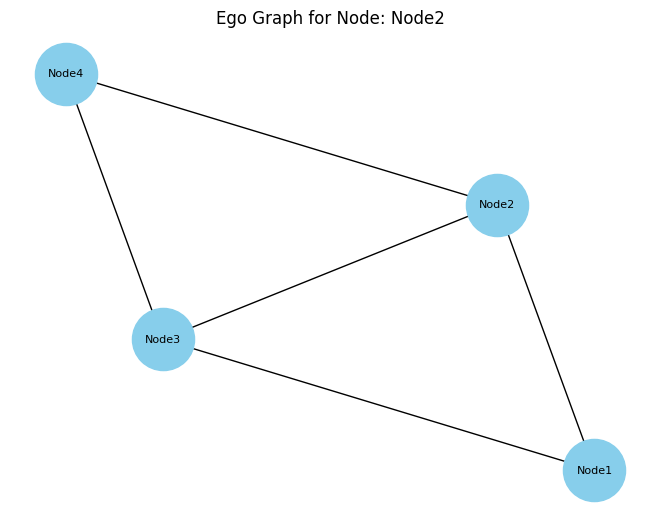

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# Sample graph data
G = nx.Graph()
edges = [("Node1", "Node2"), ("Node1", "Node3"), ("Node2", "Node3"), ("Node2", "Node4"), ("Node3", "Node4")]
G.add_edges_from(edges)

# Define the ego node
ego_node = "Node2"

# Check if the ego node exists in the graph
if ego_node in G.nodes():
    # Create the ego graph
    ego_graph = nx.ego_graph(G, ego_node, radius=1)

    # Define the position of nodes for visualization
    pos = nx.spring_layout(ego_graph)

    # Draw the ego graph
    nx.draw(ego_graph, pos, with_labels=True, node_color='skyblue', node_size=2000, font_size=8)

    # Show the plot
    plt.title(f"Ego Graph for Node: {ego_node}")
    plt.show()
else:
    print(f"The ego node {ego_node} does not exist in the graph.")


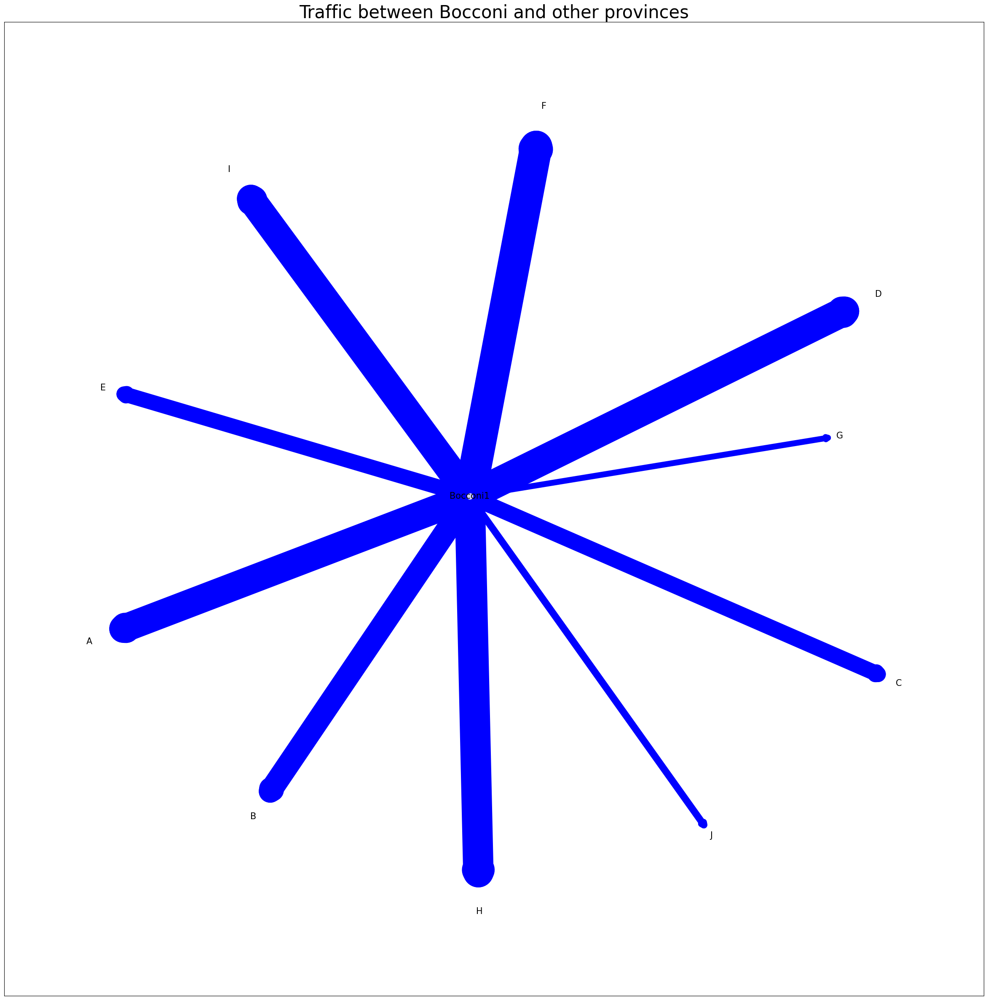

In [ ]:
import networkx as nx
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Assuming df is the DataFrame containing your dataset
# Example dataset for demonstration:
data = {
    'province': ['A', 'B', 'C', 'D', 'E','F','G','H','I','J'],
    'Bocconi1': [random.randint(10, 60) for _ in range(10)],
    'Bocconi2': [random.randint(10, 60) for _ in range(10)],
    'Bocconi3': [random.randint(10, 60) for _ in range(10)],
    'Bocconi4': [random.randint(10, 60) for _ in range(10)],
    'Bocconi5': [random.randint(10, 60) for _ in range(10)],
    'Bocconi6': [random.randint(10, 60) for _ in range(10)],
    'Bocconi7': [random.randint(10, 60) for _ in range(10)]
}
df = pd.DataFrame(data)

provinces_list = np.unique(df['province'])
G1_Bocconi = nx.DiGraph()
G1_Bocconi.add_nodes_from(provinces_list)
G1_Bocconi.add_nodes_from(['Bocconi'+str(i) for i in range(1, 8)])

for i in range(1, 8):
    for t in df['province']:
        G1_Bocconi.add_edge('Bocconi'+str(i), t, weight=df.loc[df['province'] == t, 'Bocconi'+str(i)].values[0])

fig = plt.figure(figsize=(30, 30))
E1 = nx.ego_graph(G1_Bocconi, 'Bocconi1', radius=1)

edgewidth1 = []
edgelabels1 = {}
pos1 = nx.spring_layout(E1)

for (u, v, d) in E1.edges(data=True):
    edgewidth1.append(d['weight'])
    edgelabels1[(u, v)] = d['weight']

nx.draw_networkx_edges(E1, pos1, width=edgewidth1, edge_color='b')
nx.draw_networkx_nodes(E1, pos1, alpha=0.8, node_size=100, node_color='w')
nx.draw_networkx_labels(E1, pos1, font_size=15)

plt.title("Traffic between Bocconi and other provinces", size=30)
plt.show()




/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


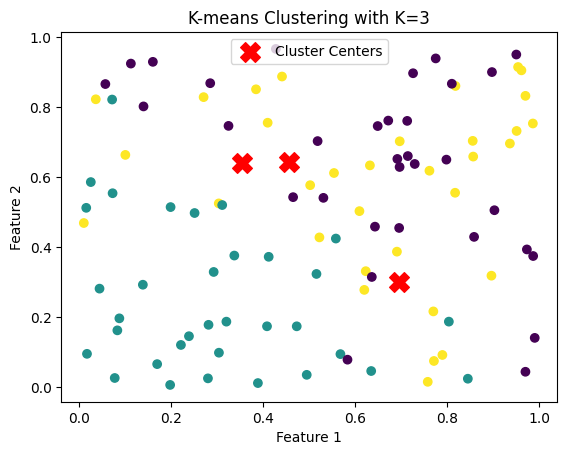

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Generate some random data points as an example
np.random.seed(42)
data = np.random.rand(100, 5)

# Choose the number of clusters (K)
K = 3

# Create the KMeans clustering model
kmeans = KMeans(n_clusters=K)

# Fit the model to the data
kmeans.fit(data)

# Get the cluster centers and labels
cluster_centers = kmeans.cluster_centers_
labels = kmeans.labels_

# Visualize the data and the cluster centers
plt.scatter(data[:, 0], data[:, 1], c=labels, cmap='viridis')
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker='X', s=200, c='red', label='Cluster Centers')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.legend()
plt.title(f'K-means Clustering with K={K}')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Cluster Centers:
[[  1.5   4.5  15.   45.  150. ]
 [  4.5   1.5  45.   15.  450. ]
 [  3.    3.   30.   30.  300. ]]

Labels:
[0 0 2 1 1]


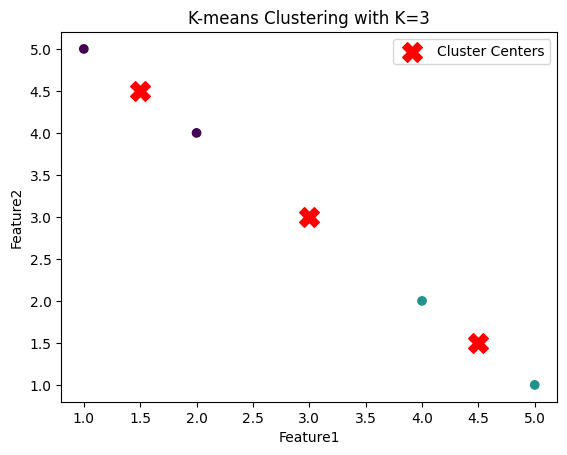

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Assuming you have a DataFrame called 'df' with 5 columns
# For example:
df = pd.DataFrame({
    'Feature1': [1, 2, 3, 4, 5],
    'Feature2': [5, 4, 3, 2, 1],
    'Feature3': [10, 20, 30, 40, 50],
    'Feature4': [50, 40, 30, 20, 10],
    'Feature5': [100, 200, 300, 400, 500]
})

# Number of clusters (K)
K = 3

# Create the KMeans clustering model
kmeans = KMeans(n_clusters=K)

# Fit the model to the data
kmeans.fit(df)

# Get the cluster centers and labels
cluster_centers = kmeans.cluster_centers_
labels = kmeans.labels_

# Print the cluster centers and labels
print("Cluster Centers:")
print(cluster_centers)
print("\nLabels:")
print(labels)

# You can perform further analysis or visualization based on the clustering results.
# For example, you can add the cluster labels as a new column in the DataFrame:
df['Cluster'] = labels

# Or you can plot the data points and the cluster centers for the first two features:
plt.scatter(df['Feature1'], df['Feature2'], c=labels, cmap='viridis')
plt.scatter(cluster_centers[:, 0], cluster_centers[:, 1], marker='X', s=200, c='red', label='Cluster Centers')
plt.xlabel('Feature1')
plt.ylabel('Feature2')
plt.legend()
plt.title(f'K-means Clustering with K={K}')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


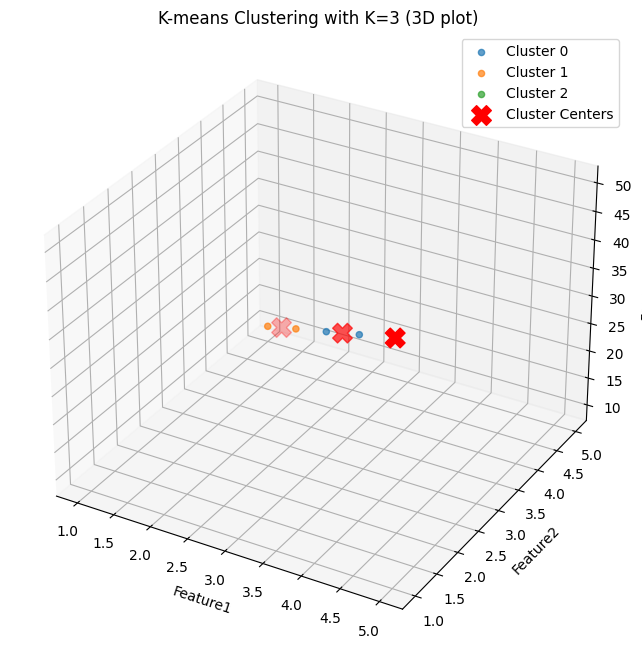

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans

# Assuming you have a DataFrame called 'df' with 5 columns
# For example:
df = pd.DataFrame({
    'Feature1': [1, 2, 3, 4, 5],
    'Feature2': [5, 4, 3, 2, 1],
    'Feature3': [10, 20, 30, 40, 50],
    'Feature4': [50, 40, 30, 20, 10],
    'Feature5': [100, 200, 300, 400, 500]
})

# Number of clusters (K)
K = 3

# Create the KMeans clustering model
kmeans = KMeans(n_clusters=K)

# Fit the model to the data
kmeans.fit(df)

# Get the cluster centers and labels
cluster_centers = kmeans.cluster_centers_
labels = kmeans.labels_

# Add the cluster labels as a new column in the DataFrame
df['Cluster'] = labels

# Choose three features for the 3D plot
feature_x = 'Feature1'
feature_y = 'Feature2'
feature_z = 'Feature3'

# Create a 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot data points with different colors based on cluster labels
for cluster in np.unique(labels):
    ax.scatter(df[df['Cluster'] == cluster][feature_x],
               df[df['Cluster'] == cluster][feature_y],
               df[df['Cluster'] == cluster][feature_z],
               label=f'Cluster {cluster}', alpha=0.7)

# Plot cluster centers
ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], cluster_centers[:, 2],
           marker='X', s=200, c='red', label='Cluster Centers')

# Set labels for the three axes
ax.set_xlabel(feature_x)
ax.set_ylabel(feature_y)
ax.set_zlabel(feature_z)

# Add a legend
ax.legend()

# Show the 3D plot
plt.title(f'K-means Clustering with K={K} (3D plot)')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


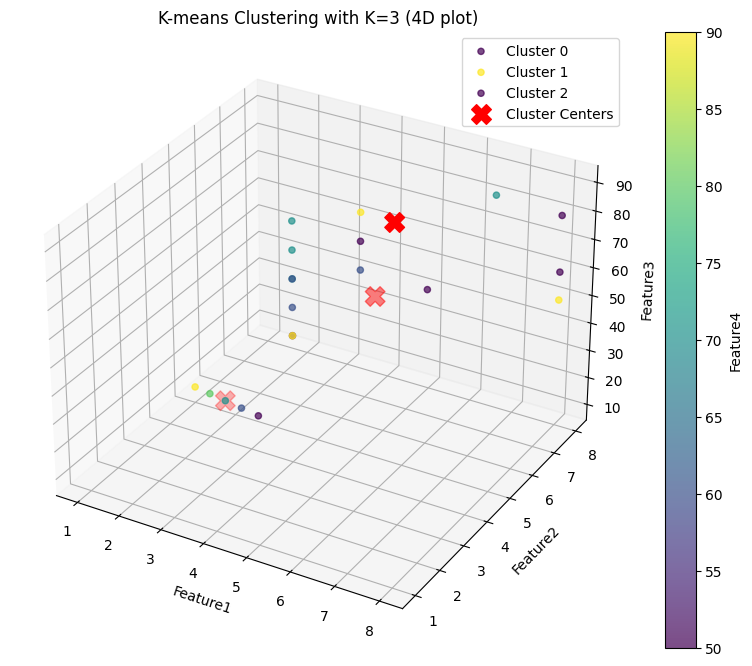

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans

# Assuming you have a DataFrame called 'df' with 4 columns
# For example:
df = pd.DataFrame({
    'Feature1': [1, 2, 3, 4, 5,6,5,8,7,8,8,4,5,4,4,4,4,4,5,4],
    'Feature2': [5, 4, 3, 2, 1,6,5,8,7,8,8,4,5,4,4,4,4,4,5,4],
    'Feature3': [10, 20, 30, 40, 50,60,70,80,90, 50,60,70,80,90,50,60,70,80,90,50],
    'Feature4': [50, 40, 30, 20, 10, 50,60,70,80,90, 50,60,70,80,90,60,70,80,90,50]
})

# Number of clusters (K)
K = 3

# Create the KMeans clustering model
kmeans = KMeans(n_clusters=K)

# Fit the model to the data
kmeans.fit(df)

# Get the cluster centers and labels
cluster_centers = kmeans.cluster_centers_
labels = kmeans.labels_

# Add the cluster labels as a new column in the DataFrame
df['Cluster'] = labels

# Choose three features for the 3D plot
feature_x = 'Feature1'
feature_y = 'Feature2'
feature_z = 'Feature3'
feature_c = 'Feature4'  # Fourth dimension to be represented by color

# Create a 4D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot data points with color based on cluster labels
for cluster in np.unique(labels):
    ax.scatter(df[df['Cluster'] == cluster][feature_x],
               df[df['Cluster'] == cluster][feature_y],
               df[df['Cluster'] == cluster][feature_z],
               c=df[df['Cluster'] == cluster][feature_c], cmap='viridis',
               label=f'Cluster {cluster}', alpha=0.7)

# Plot cluster centers
ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], cluster_centers[:, 2],
           marker='X', s=200, c='red', label='Cluster Centers')

# Set labels for the three axes
ax.set_xlabel(feature_x)
ax.set_ylabel(feature_y)
ax.set_zlabel(feature_z)

# Add a color bar for the fourth dimension
cbar = plt.colorbar(ax.collections[0])
cbar.ax.set_ylabel(feature_c)

# Add a legend
ax.legend()

# Show the 4D scatter plot
plt.title(f'K-means Clustering with K={K} (4D plot)')
plt.show()



In [ ]:
df

,Feature1,Feature2,Feature3,Feature4,Feature5,Cluster
0,1,5,10,50,100,1
1,2,4,20,40,200,0
2,3,3,30,30,150,0
3,4,2,40,20,250,2
4,5,1,50,10,180,0


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


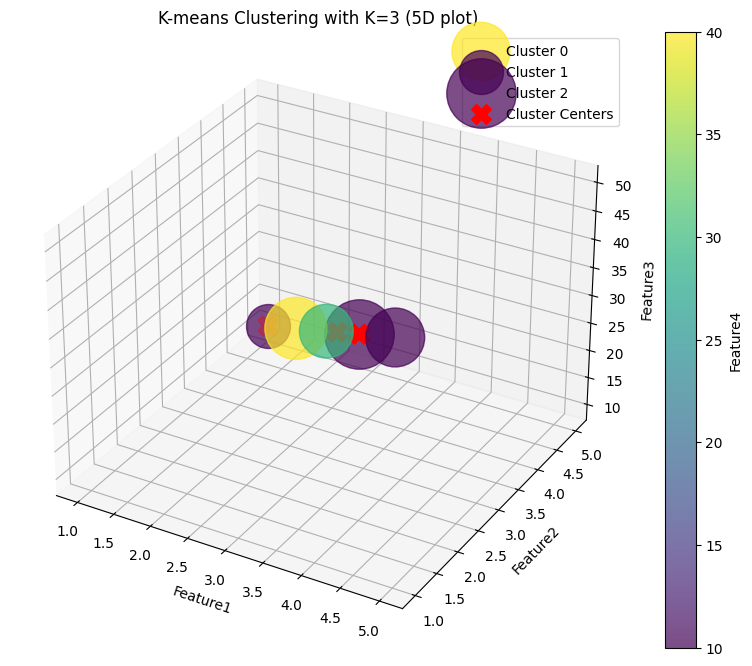

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans

# Assuming you have a DataFrame called 'df' with 5 columns
# For example:
df = pd.DataFrame({
    'Feature1': [1, 2, 3, 4, 5],
    'Feature2': [5, 4, 3, 2, 1],
    'Feature3': [10, 20, 30, 40, 50],
    'Feature4': [50, 40, 30, 20, 10],
    'Feature5': [100, 200, 150, 250, 180]
})

# Number of clusters (K)
K = 3

# Create the KMeans clustering model
kmeans = KMeans(n_clusters=K)

# Fit the model to the data
kmeans.fit(df)

# Get the cluster centers and labels
cluster_centers = kmeans.cluster_centers_
labels = kmeans.labels_

# Add the cluster labels as a new column in the DataFrame
df['Cluster'] = labels

# Choose three features for the 3D plot
feature_x = 'Feature1'
feature_y = 'Feature2'
feature_z = 'Feature3'
feature_c = 'Feature4'  # Fourth dimension to be represented by color
feature_size = 'Feature5'  # Fifth dimension to be represented by marker size

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot data points with color and marker size based on cluster labels and fifth dimension
for cluster in np.unique(labels):
    ax.scatter(df[df['Cluster'] == cluster][feature_x],
               df[df['Cluster'] == cluster][feature_y],
               df[df['Cluster'] == cluster][feature_z],
               c=df[df['Cluster'] == cluster][feature_c],
               s=df[df['Cluster'] == cluster][feature_size] * 10,  # Adjust the size scaling factor as needed
               cmap='viridis',
               label=f'Cluster {cluster}',
               alpha=0.7)

# Plot cluster centers
ax.scatter(cluster_centers[:, 0], cluster_centers[:, 1], cluster_centers[:, 2],
           marker='X', s=200, c='red', label='Cluster Centers')

# Set labels for the three axes
ax.set_xlabel(feature_x)
ax.set_ylabel(feature_y)
ax.set_zlabel(feature_z)

# Add a color bar for the fourth dimension
cbar = plt.colorbar(ax.collections[0])
cbar.ax.set_ylabel(feature_c)

# Add a legend
ax.legend()

# Show the 3D scatter plot
plt.title(f'K-means Clustering with K={K} (5D plot)')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


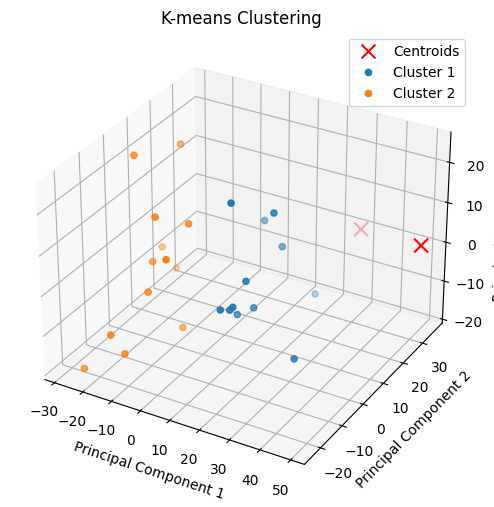

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # Required for 3D plot

# Assuming you have a DataFrame called 'data' with features and labels
# For example:
data = pd.DataFrame({
    'Feature1': [random.randint(10, 60) for _ in range(25)],
    'Feature2': [random.randint(10, 60) for _ in range(25)],
    'Feature3': [random.randint(10, 60) for _ in range(25)],
    'Feature4': [random.randint(10, 60) for _ in range(25)],
    'Feature5': [random.randint(10, 60) for _ in range(25)],
    'Label': [random.randint(0, 1) for _ in range(25)]  # Ground truth labels
})

# Separate features and labels
X = data.drop('Label', axis=1)  # Features (input data)
y_true = data['Label']  # Ground truth labels

# Number of clusters (K)
K = 2

# Create the KMeans clustering model
kmeans = KMeans(n_clusters=K)

# Fit the model to the feature data (input data)
kmeans.fit(X)

# Get the cluster assignments for each data point
y_pred = kmeans.labels_
# Get the coordinates of the cluster centroids
centroids = kmeans.cluster_centers_

# Apply PCA for dimensionality reduction to 3D
pca = PCA(n_components=3)
X_reduced = pca.fit_transform(X)

# Create a 3D scatter plot
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
# Plot the centroids
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=100, c='red', label='Centroids')


# Plot the data points and color them based on cluster assignments
for i in range(K):
    ax.scatter(X_reduced[y_pred == i, 0], X_reduced[y_pred == i, 1], X_reduced[y_pred == i, 2], label=f'Cluster {i+1}')

ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('K-means Clustering')
ax.legend()

plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


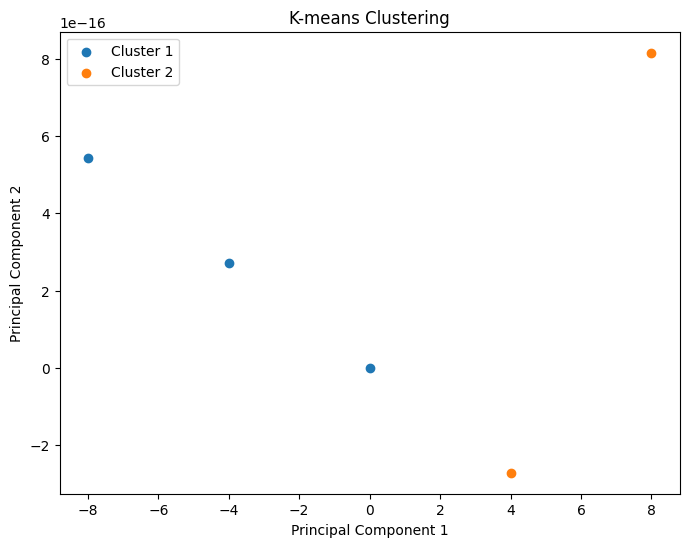

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'data' with features and labels
# For example:
data = pd.DataFrame({
    'Feature1': [1, 2, 3, 4, 5],
    'Feature2': [5, 4, 3, 2, 1],
    'Feature3': [2, 4, 6, 8, 10],
    'Feature4': [3, 6, 9, 12, 15],
    'Feature5': [7, 8, 9, 10, 11],
    'Label': [0, 1, 0, 1, 0]  # Ground truth labels
})

# Separate features and labels
X = data.drop('Label', axis=1)  # Features (input data)
y_true = data['Label']  # Ground truth labels

# Number of clusters (K)
K = 2

# Create the KMeans clustering model
kmeans = KMeans(n_clusters=K)

# Fit the model to the feature data (input data)
kmeans.fit(X)

# Get the cluster assignments for each data point
y_pred = kmeans.labels_

# Apply PCA for dimensionality reduction to 2D
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X)

# Create a scatter plot
plt.figure(figsize=(8, 6))

# Plot the data points and color them based on cluster assignments
for i in range(K):
    plt.scatter(X_reduced[y_pred == i, 0], X_reduced[y_pred == i, 1], label=f'Cluster {i+1}')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-means Clustering')
plt.legend()

plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


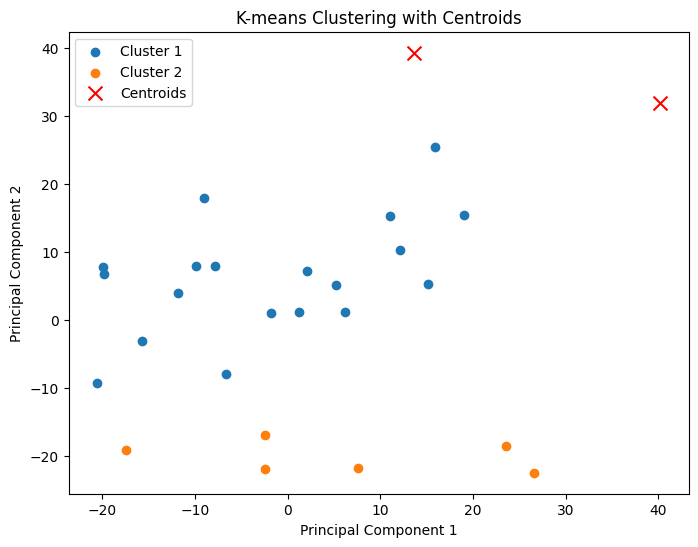

In [ ]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Assuming you have a DataFrame called 'data' with features and labels
# For example:
data = pd.DataFrame({
    'Feature1': [random.randint(10, 60) for _ in range(25)],
    'Feature2': [random.randint(10, 60) for _ in range(25)],
    # 'Feature3': [random.randint(10, 60) for _ in range(25)],
    # 'Feature4': [random.randint(10, 60) for _ in range(25)],
    # 'Feature5': [random.randint(10, 60) for _ in range(25)],
    'Label': [random.randint(0, 1) for _ in range(25)]  # Ground truth labels
})

# Separate features and labels
X = data.drop('Label', axis=1)  # Features (input data)
y_true = data['Label']  # Ground truth labels

# Number of clusters (K)
K = 2

# Create the KMeans clustering model
kmeans = KMeans(n_clusters=K)

# Fit the model to the feature data (input data)
kmeans.fit(X)

# Get the cluster assignments for each data point
y_pred = kmeans.labels_

# Get the coordinates of the cluster centroids
centroids = kmeans.cluster_centers_

# Apply PCA for dimensionality reduction to 2D
pca = PCA(n_components=2)
X_reduced = pca.fit_transform(X)

# Create a scatter plot
plt.figure(figsize=(8, 6))

# Plot the data points and color them based on cluster assignments
for i in range(K):
    plt.scatter(X_reduced[y_pred == i, 0], X_reduced[y_pred == i, 1], label=f'Cluster {i+1}')

# Plot the centroids
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=100, c='red', label='Centroids')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-means Clustering with Centroids')
plt.legend()

plt.show()


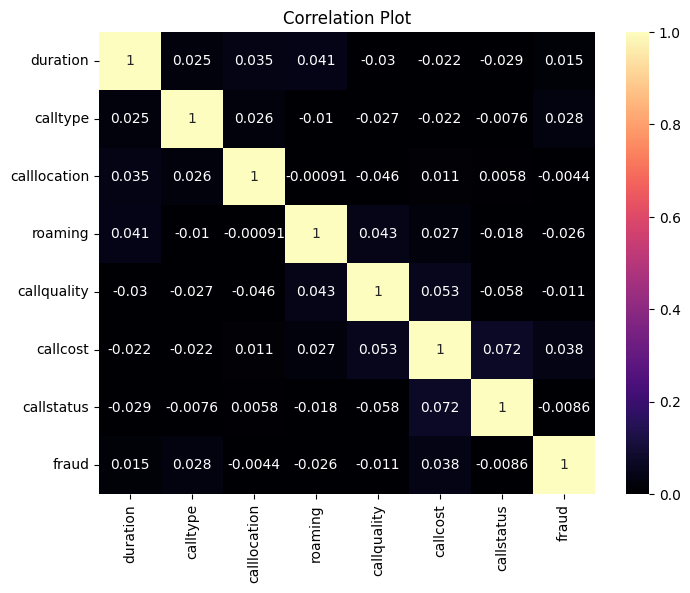

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
# 'CallStart', 'CallEnd', 'Duration', 'CallerNumber', 'RecipientNumber',
#        'CallType', 'CallStatus', 'CallCost', 'CallLocation', 'Roaming',
#        'CallHandover', 'CallQuality', 'CallID', 'DeviceType', 'FraudActivity']
#encoding
labelencoder=LabelEncoder()
dataset=pd.read_csv("generated_CDR_dataset.csv")


dataset["CallType"]=labelencoder.fit_transform(dataset["CallType"])
dataset["CallStatus"]=labelencoder.fit_transform(dataset["CallStatus"])
dataset["CallLocation"] = labelencoder.fit_transform(dataset["CallLocation"])
dataset["Roaming"] = labelencoder.fit_transform(dataset["Roaming"])
dataset["CallQuality"] = labelencoder.fit_transform(dataset["CallQuality"])
# Example dataset
data = {
    'duration': dataset["Duration"],
    'calltype': dataset["CallType"],
    'calllocation': dataset["CallLocation"],
    'roaming': dataset["Roaming"],
    'callquality': dataset["CallQuality"],
    'callcost':dataset["CallCost"],
    "callstatus" : dataset["CallStatus"],
    "fraud" : dataset["FraudActivity"]
}

df = pd.DataFrame(data)

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Create the correlation plot using seaborn
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='magma', vmin=-0, vmax=1)
plt.title('Correlation Plot')
plt.show()


In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
labelencoder=LabelEncoder()

In [ ]:
dataset["CallType"]=labelencoder.fit_transform(dataset["CallType"])

In [ ]:
dataset["CallType"].unique()

array([0, 1, 2])

In [ ]:
data=pd.DataFrame(data)
data

,duration,calltype,calllocation,roaming,callquality,callcost,callstatus,fraud
0,364,0,9,1,0,1.75,1,1
1,71,1,9,0,0,0.42,2,0
2,147,2,4,1,1,0.39,1,0
3,75,0,8,0,0,2.38,2,1
4,321,1,4,0,0,1.80,1,0
...,...,...,...,...,...,...,...,...
995,267,1,1,0,0,1.56,1,1
996,402,2,0,1,1,0.21,2,0
997,416,1,7,1,1,0.28,1,1
998,134,1,6,0,1,1.37,0,0


import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_6942584764922789309, *['duration'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_6942584764922789309, *['calltype'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_6942584764922789309, *['calllocation'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_6942584764922789309, *['roaming'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_6942584764922789309, *['duration'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_6942584764922789309, *['calltype'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_6942584764922789309, *['calllocation'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_6942584764922789309, *['roaming'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def scatter_plots(df, colname_pairs, scatter_plot_size=2.5, size=8, alpha=.6):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * scatter_plot_size, scatter_plot_size))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    ax.scatter(df[x_colname], df[y_colname], s=size, alpha=alpha)
    plt.xlabel(x_colname)
    plt.ylabel(y_colname)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df_6942584764922789309, *[[['duration', 'calltype'], ['calltype', 'calllocation'], ['calllocation', 'roaming'], ['roaming', 'callquality']]], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_6942584764922789309, *['duration'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_6942584764922789309, *['calltype'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_6942584764922789309, *['calllocation'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_6942584764922789309, *['roaming'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_6942584764922789309, *['duration'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_6942584764922789309, *['calltype'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_6942584764922789309, *['calllocation'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_6942584764922789309, *['roaming'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6942584764922789309 = autoviz.get_df('df_6942584764922789309')

def scatter_plots(df, colname_pairs, scatter_plot_size=2.5, size=8, alpha=.6):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * scatter_plot_size, scatter_plot_size))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    ax.scatter(df[x_colname], df[y_colname], s=size, alpha=alpha)
    plt.xlabel(x_colname)
    plt.ylabel(y_colname)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df_6942584764922789309, *[[['duration', 'calltype'], ['calltype', 'calllocation'], ['calllocation', 'roaming'], ['roaming', 'callquality']]], **{})
chart

In [ ]:
data.describe()

,duration,calltype,calllocation,roaming,callquality,callcost,callstatus,fraud
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,329.312000,0.979000,4.640000,0.513000,0.997000,1.301810,0.999000,0.496000
std,156.740404,0.813154,2.904623,0.500081,0.812189,0.686494,0.813425,0.500234
min,60.000000,0.000000,0.000000,0.000000,0.000000,0.100000,0.000000,0.000000
25%,193.000000,0.000000,2.000000,0.000000,0.000000,0.720000,0.000000,0.000000
50%,334.000000,1.000000,5.000000,1.000000,1.000000,1.325000,1.000000,0.000000
75%,467.250000,2.000000,7.000000,1.000000,2.000000,1.870000,2.000000,1.000000
max,600.000000,2.000000,9.000000,1.000000,2.000000,2.500000,2.000000,1.000000


In [ ]:
kaggle=pd.read_csv("Cleaned_CDR_data.csv")

In [ ]:
kaggle.describe()

,Account Length,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Local call minutes,Local call charge,Local call count
count,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000,7467.000000
mean,168.991027,10.286996,285.289728,172.567430,37.245713,304.285871,169.654078,28.541452,304.431150,170.511049,13.543290,17.840364,5.164725,3.568208,2.285121,894.006750,79.330455,512.732557
std,145.949840,17.694849,140.141595,137.775132,12.524656,130.276256,137.139774,13.984042,130.353556,137.018014,12.203904,14.418561,5.250737,1.246306,1.702647,370.637731,30.980374,301.542710
min,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,20.600000,20.000000,1.040000,0.000000,0.000000,0.000000,0.000000,275.200000,19.980000,77.000000
25%,70.000000,0.000000,175.900000,87.000000,26.820000,203.200000,86.000000,17.140000,203.200000,86.000000,7.215000,8.400000,3.000000,2.540000,1.000000,587.650000,54.900000,292.000000
50%,101.000000,0.000000,232.200000,102.000000,37.010000,248.500000,101.000000,22.690000,247.000000,102.000000,9.040000,10.800000,4.000000,3.320000,2.000000,704.100000,67.000000,345.000000
75%,222.000000,22.000000,446.700000,222.000000,46.850000,448.850000,220.000000,44.750000,448.500000,220.000000,11.500000,22.300000,6.000000,4.640000,4.000000,1351.950000,102.625000,628.000000
max,499.000000,59.000000,557.400000,465.000000,59.980000,565.700000,470.000000,50.940000,595.000000,475.000000,47.770000,48.900000,49.000000,5.970000,9.000000,1563.300000,153.810000,1362.000000


In [ ]:
kaggle.head(10)

,Phone Number,Account Length,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn,Local call minutes,Local call charge,Local call count
0,382-4657,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,707.2,72.86,300
1,371-7191,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,611.5,55.54,329
2,358-1921,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,527.2,59.00,328
3,375-9999,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,558.2,65.02,248
4,330-6626,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,501.9,49.36,356
5,391-8027,118,0,223.4,98,37.98,220.6,101,18.75,203.9,118,9.18,6.3,6,1.70,0,False,647.9,65.91,317
6,355-9993,121,24,218.2,88,37.09,348.5,108,29.62,212.6,118,9.57,7.5,7,2.03,3,False,779.3,76.28,314
7,329-9001,147,0,157.0,79,26.69,103.1,94,8.76,211.8,96,9.53,7.1,6,1.92,0,False,471.9,44.98,269
8,335-4719,117,0,184.5,97,31.37,351.6,80,29.89,215.8,90,9.71,8.7,4,2.35,1,False,751.9,70.97,267
9,330-8173,141,37,258.6,84,43.96,222.0,111,18.87,326.4,97,14.69,11.2,5,3.02,0,False,807.0,77.52,292


import numpy as np
from google.colab import autoviz
df_4694160173845506543 = autoviz.get_df('df_4694160173845506543')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_4694160173845506543, *['Account Length'], **{})
chart

import numpy as np
from google.colab import autoviz
df_7031563597438797335 = autoviz.get_df('df_7031563597438797335')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_7031563597438797335, *['VMail Message'], **{})
chart

import numpy as np
from google.colab import autoviz
df_7877706367059861192 = autoviz.get_df('df_7877706367059861192')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_7877706367059861192, *['Day Mins'], **{})
chart

import numpy as np
from google.colab import autoviz
df_1466554658535889587 = autoviz.get_df('df_1466554658535889587')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_1466554658535889587, *['Day Calls'], **{})
chart

import numpy as np
from google.colab import autoviz
df_1259380656546472326 = autoviz.get_df('df_1259380656546472326')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_1259380656546472326, *['Account Length'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4853270042162054195 = autoviz.get_df('df_4853270042162054195')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_4853270042162054195, *['VMail Message'], **{})
chart

import numpy as np
from google.colab import autoviz
df_2441734124820642707 = autoviz.get_df('df_2441734124820642707')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_2441734124820642707, *['Day Mins'], **{})
chart

import numpy as np
from google.colab import autoviz
df_9161906515547986090 = autoviz.get_df('df_9161906515547986090')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_9161906515547986090, *['Day Calls'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6971774354891172959 = autoviz.get_df('df_6971774354891172959')

def scatter_plots(df, colname_pairs, scatter_plot_size=2.5, size=8, alpha=.6):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * scatter_plot_size, scatter_plot_size))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    ax.scatter(df[x_colname], df[y_colname], s=size, alpha=alpha)
    plt.xlabel(x_colname)
    plt.ylabel(y_colname)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df_6971774354891172959, *[[['Account Length', 'VMail Message'], ['VMail Message', 'Day Mins'], ['Day Mins', 'Day Calls'], ['Day Calls', 'Day Charge']]], **{})
chart

<ipython-input-76-a3b24a861cb8>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = kaggle.corr()


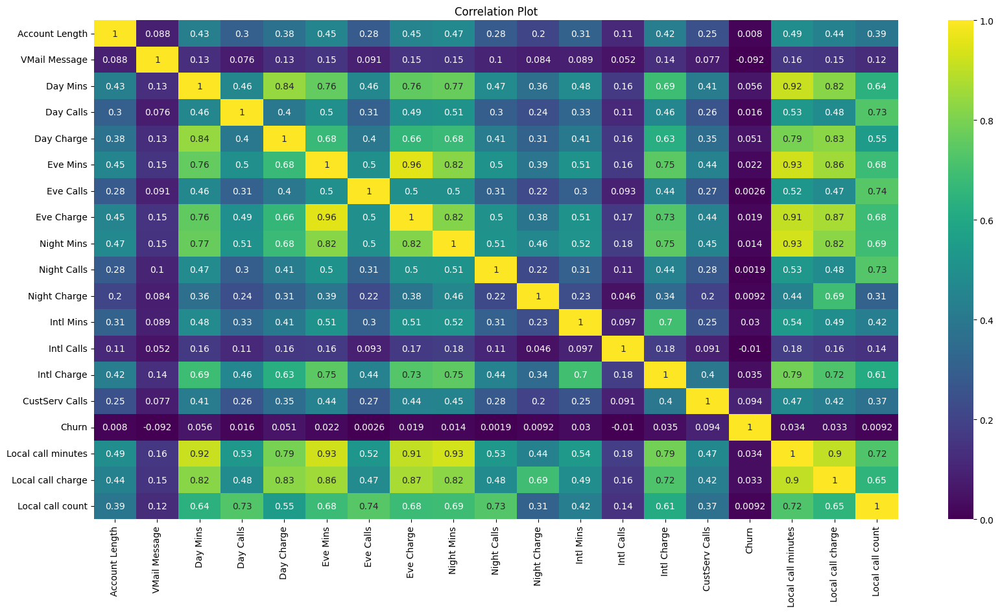

In [ ]:
# Calculate the correlation matrix
correlation_matrix = kaggle.corr()

# Create the correlation plot using seaborn
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', vmin=0, vmax=1)
plt.title('Correlation Plot')
plt.show()


<ipython-input-4-88bf66fb4bcd>:11: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.1`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(data,bw=0.1, label='Bandwidth=0.1', shade=False)
<ipython-input-4-88bf66fb4bcd>:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=False`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data,bw=0.1, label='Bandwidth=0.1', shade=False)
<ipython-input-4-88bf66fb4bcd>:12: UserWarning: 

The `bw` parameter is deprecated in favor of `bw_method` and `bw_adjust`.
Setting `bw_method=0.2`, but please see the docs for the new parameters
and update your code. This will become an error in seaborn v0.13.0.

  sns.kdeplot(data,bw=0.2, label='Bandwidth=0.2', shade=False)
<ipython-input-4-88bf66fb4bcd>:12: FutureWarning: 

`shade` is now deprecated in favor of

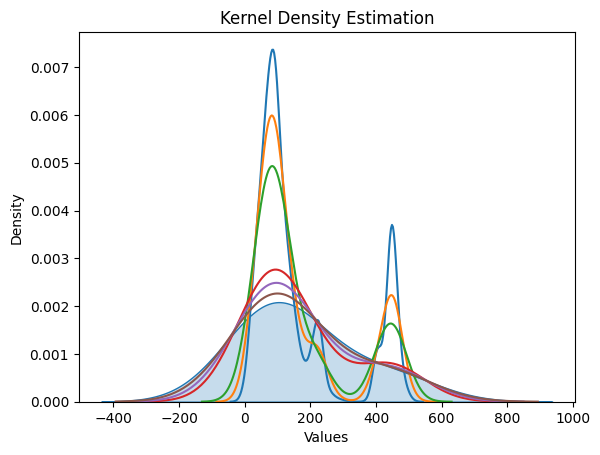

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

kaggle=pd.read_csv("Cleaned_CDR_data.csv")

# Sample data
data =  kaggle["Account Length"]

# Plotting the KDE
sns.kdeplot(data,bw=0.1, label='Bandwidth=0.1', shade=False)
sns.kdeplot(data,bw=0.2, label='Bandwidth=0.2', shade=False)
sns.kdeplot(data,bw=0.3, label='Bandwidth=0.3', shade=False)
sns.kdeplot(data,bw=0.7, label='Bandwidth=0.7', shade=False)
sns.kdeplot(data,bw=0.8, label='Bandwidth=0.8', shade=False)
sns.kdeplot(data,bw=0.9, label='Bandwidth=0.9', shade=False)
sns.kdeplot(data,bw=1, label='Bandwidth=1', shade=True)


# Adding labels and title
plt.xlabel('Values')
plt.ylabel('Density')
plt.title('Kernel Density Estimation')

# Display the plot
plt.show()




In [ ]:
kaggle.columns

Index(['Phone Number', 'Account Length', 'VMail Message', 'Day Mins',
       'Day Calls', 'Day Charge', 'Eve Mins', 'Eve Calls', 'Eve Charge',
       'Night Mins', 'Night Calls', 'Night Charge', 'Intl Mins', 'Intl Calls',
       'Intl Charge', 'CustServ Calls', 'Churn', 'Local call minutes',
       'Local call charge', 'Local call count'],
      dtype='object')

In [ ]:
import plotly.express as px
df = px.data.gapminder()
px.scatter(df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
           size="pop", color="continent", hover_name="country",
           log_x=True, size_max=55, range_x=[100,100000], range_y=[25,90])

In [ ]:
import plotly.graph_objects as go
from plotly.colors import n_colors
import numpy as np
np.random.seed(1)

# 12 sets of normal distributed random data, with increasing mean and standard deviation
data = (np.linspace(1, 2, 12)[:, np.newaxis] * np.random.randn(12, 200) +
            (np.arange(12) + 2 * np.random.random(12))[:, np.newaxis])

colors = n_colors('rgb(5, 200, 200)', 'rgb(200, 10, 10)', 12, colortype='rgb')

fig = go.Figure()
for data_line, color in zip(data, colors):
    fig.add_trace(go.Violin(x=data_line, line_color=color))

fig.update_traces(orientation='h', side='positive', width=3, points=False)
fig.update_layout(xaxis_showgrid=False, xaxis_zeroline=False)
fig.show()

In [ ]:
import pandas as pd
import plotly.express as px

# Create a new DataFrame with appropriate column names
new_df = pd.DataFrame({
    "gdpPercap": kaggle["Day Charge"],  # Using 'Day Charge' as 'gdpPercap'
    "lifeExp": kaggle["CustServ Calls"],  # Using 'CustServ Calls' as 'lifeExp'
    "year": kaggle["Phone Number"],  # Using 'Phone Number' as 'year' (just to show animation_frame)
    "country": kaggle["Phone Number"],  # Using 'Phone Number' as 'country' (just for animation_group)
    "pop": kaggle["Account Length"],  # Using 'Account Length' as 'pop'
    "continent": kaggle["Churn"],  # Using 'Churn' as 'continent' (just for color)
})

# Create the scatter plot with animation
fig = px.scatter(new_df, x="gdpPercap", y="lifeExp", animation_frame="year", animation_group="country",
                 size="pop", color="continent", hover_name="country",
                 log_x=True, size_max=55, range_x=[100, 100000], range_y=[25, 90])

# Show the plot
fig.show()


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt


In [ ]:
data=pd.read_csv("Cleaned_CDR_data.csv")


In [ ]:
data

,Phone Number,Account Length,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn,Local call minutes,Local call charge,Local call count
0,382-4657,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,707.2,72.86,300
1,371-7191,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,611.5,55.54,329
2,358-1921,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,527.2,59.00,328
3,375-9999,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,558.2,65.02,248
4,330-6626,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,501.9,49.36,356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7462,989-7856,222,0,223.2,226,20.23,229.3,92,22.29,222.0,36,20.22,23.6,3,3.62,3,True,674.5,62.74,354
7463,797-6875,29,0,232.2,93,22.90,239.2,63,26.22,222.2,223,9.96,22.3,3,3.29,2,False,693.6,59.08,379
7464,979-9576,63,0,232.2,32,39.29,233.2,33,23.02,292.3,223,3.62,9.6,2,2.39,3,False,757.7,65.93,288
7465,778-7577,23,0,230.3,209,30.22,233.3,33,22.33,292.9,92,3.62,22.2,6,3.32,2,False,756.5,56.17,334


In [ ]:
from sklearn.preprocessing import LabelEncoder

In [ ]:
labelencoder=LabelEncoder()

In [ ]:
data.columns

Index(['Phone Number', 'Account Length', 'VMail Message', 'Day Mins',
       'Day Calls', 'Day Charge', 'Eve Mins', 'Eve Calls', 'Eve Charge',
       'Night Mins', 'Night Calls', 'Night Charge', 'Intl Mins', 'Intl Calls',
       'Intl Charge', 'CustServ Calls', 'Churn', 'Local call minutes',
       'Local call charge', 'Local call count'],
      dtype='object')

In [ ]:
data["Churn"]=labelencoder.fit_transform(data["Churn"])
data["Churn"]

0       0
1       0
2       0
3       0
4       0
       ..
7462    1
7463    0
7464    0
7465    0
7466    0
Name: Churn, Length: 7467, dtype: int64

In [ ]:
data.head()

,Phone Number,Account Length,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn,Local call minutes,Local call charge,Local call count
0,382-4657,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,0,707.2,72.86,300
1,371-7191,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,0,611.5,55.54,329
2,358-1921,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,0,527.2,59.00,328
3,375-9999,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,0,558.2,65.02,248
4,330-6626,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,0,501.9,49.36,356


<ipython-input-18-852e316499f3>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = data.corr()


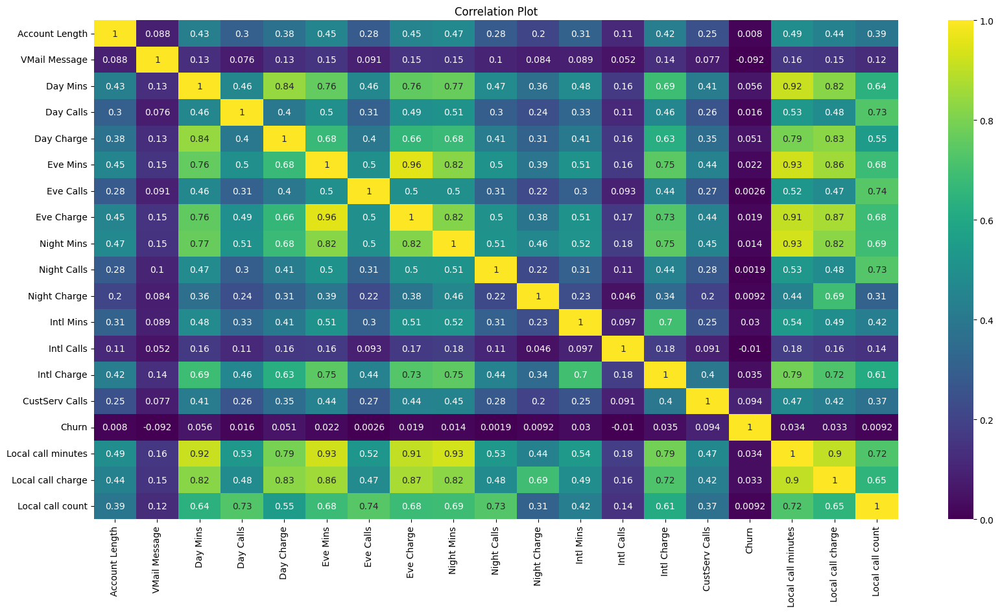

In [ ]:
# Calculate the correlation matrix
correlation_matrix = data.corr()

# Create the correlation plot using seaborn
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='viridis', vmin=0, vmax=1)
plt.title('Correlation Plot')
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


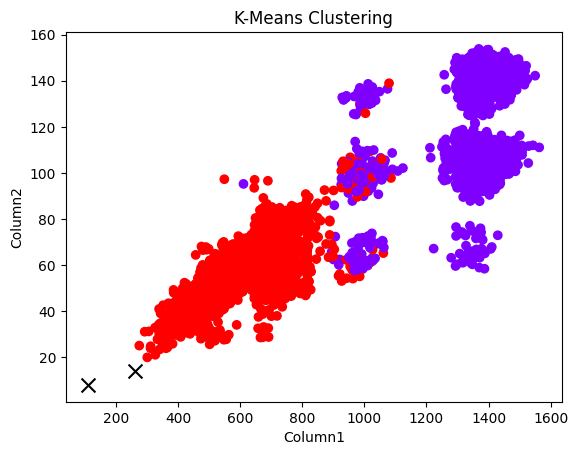

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# # Create a sample 5-column dataset
# data1 = {
#     data.drop('Phone Number', axis=1)
#     # 'Column1': np.random.rand(100),
#     # 'Column2': np.random.rand(100),
#     # 'Column3': np.random.rand(100),
#     # 'Column4': np.random.rand(100),
#     # 'Column5': np.random.rand(100)
# }
# df = pd.DataFrame(data)

df=data.drop("Phone Number",axis=1)
# Define the target column y
# y = df['target_column_name']

# Number of clusters
k = 2

# Initialize k-means clustering
kmeans = KMeans(n_clusters=k)

# Fit the model to the data
kmeans.fit(df)

# Get the cluster centers and labels
centers = kmeans.cluster_centers_
labels = kmeans.labels_

# Add the cluster labels to the DataFrame
df['Cluster'] = labels

# Plot the data points colored by cluster
plt.scatter(df['Local call minutes'], df['Local call charge'], c=labels, cmap='rainbow')
plt.scatter(centers[:, 0], centers[:, 1], c='black', marker='x', s=100)
plt.title('K-Means Clustering')
plt.xlabel('Column1')
plt.ylabel('Column2')
plt.show()


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np

data=pd.read_csv("Cleaned_CDR_data.csv")

# Define X (feature matrix) and y (target column)
df=data.drop("Phone Number",axis=1)

X = df.drop('Churn', axis=1)
y = df['Churn']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a logistic regression model and fit it to the training data
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Plot the decision boundary and data points
plt.figure(figsize=(8, 6))
# Assuming there are only two features for simplicity
plt.scatter(X_test['Local call minutes'], X_test['Local call charge'], c=y_test, cmap='coolwarm', marker='o', edgecolors='k', label='Actual Data')
plt.scatter(X_test['Local call minutes'], X_test['Local call charge'], c=y_pred, cmap='coolwarm', marker='x', s=50, label='Predicted Data')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

# Plot the decision boundary
x_min, x_max = X_test['Local call minutes'].min() - 1, X_test['Local call minutes'].max() + 1
y_min, y_max = X_test['Local call charge'].min() - 1, X_test['Local call charge'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))
Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.contourf(xx, yy, Z, alpha=0.3, cmap='coolwarm')

plt.title("Logistic Regression - Decision Boundary")
plt.legend()
plt.show()








FileNotFoundError: ignored

In [ ]:
import pandas as pd
from imblearn.under_sampling import RandomUnderSampler

# Load your imbalanced dataset into a pandas DataFrame (replace 'your_dataset.csv' with your actual dataset file)
data = pd.read_csv('Cleaned_CDR_data.csv')
df=data.drop("Phone Number",axis=1)

X = df.drop('Churn', axis=1)
# Define X (feature matrix) and y (target column)

y = df['Churn']

# Perform undersampling
undersampler = RandomUnderSampler(random_state=42)
X_resampled, y_resampled = undersampler.fit_resample(X, y)
X=X_resampled
y=y_resampled
# The resulting X_resampled and y_resampled will be the balanced dataset
# You can now use X_resampled and y_resampled for training your machine learning model


In [ ]:
X.shape

(2158, 18)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a logistic regression model and fit it to the training data
model = LogisticRegression()
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)


# Plot the decision boundary and data points
plt.figure(figsize=(8, 6))
# Assuming there are only two features for simplicity
plt.scatter(X_test['Local call minutes'], X_test['Local call charge'], c=y_test, cmap='coolwarm', marker='o', edgecolors='k', label='Actual Data')
plt.scatter(X_test['Local call minutes'], X_test['Local call charge'], c=y_pred, cmap='coolwarm', marker='x', s=50, label='Predicted Data')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')

# Plot the decision boundary
x_min, x_max = X_test['Local call minutes'].min() - 1, X_test['Local call minutes'].max() + 1
y_min, y_max = X_test['Local call charge'].min() - 1, X_test['Local call charge'].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.01), np.arange(y_min, y_max, 0.01))
Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)
plt.contourf(xx, yy, Z, alpha=0.3, cmap='coolwarm')

plt.title("Logistic Regression - Decision Boundary")
plt.legend()
plt.show()


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 0.5717592592592593


In [ ]:
y_resampled.shape

(2158,)

In [ ]:
y_resampled.value_counts()

False    1079
True     1079
Name: Churn, dtype: int64

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create KNN classifier with k=5
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the classifier on the training data
knn.fit(X_train, y_train)

# Make predictions on the test data
y_pred = knn.predict(X_test)

# Plot the decision boundary
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))
Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, alpha=0.8)
plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', s=30)
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('KNN Decision Boundary')
plt.show()


InvalidIndexError: ignored

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder

from sklearn.metrics import accuracy_score

data=pd.read_csv("Cleaned_CDR_data.csv")

df=data.drop("Phone Number",axis=1)

X = df.drop('Churn', axis=1)
# Define X (feature matrix) and y (target column)

y = df['Churn']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create KNN classifier with k=5
knn = KNeighborsClassifier(n_neighbors=5)

# Fit the classifier on the training data
knn.fit(X_train, y_train)

# Make predictions on the test data
y_pred = knn.predict(X_test)

# Plot the decision boundary for the first two features (Duration and CallerNumber)
feature1 = 'Duration'
feature2 = 'CallerNumber'
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# x_min, x_max = X[feature1].min() - 1, X[feature1].max() + 1
# y_min, y_max = X[feature2].min() - 1, X[feature2].max() + 1

# xx, yy = np.meshgrid(np.arange(x_min, x_max, 1), np.arange(y_min, y_max, 1))
# Z = knn.predict(np.c_[xx.ravel(), yy.ravel()])
# Z = Z.reshape(xx.shape)

# plt.figure(figsize=(10, 6))
# plt.contourf(xx, yy, Z, alpha=0.8, cmap=plt.cm.Paired)
# plt.scatter(X[feature1], X[feature2], c=y, edgecolors='k', cmap=plt.cm.Paired)
# plt.xlabel(feature1)
# plt.ylabel(feature2)
# plt.title('KNN Decision Boundary for CDR Dataset')
# plt.show()


Accuracy: 0.8493975903614458


Accuracy: 0.8333333333333334

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        10
           1       0.70      0.78      0.74         9
           2       0.80      0.73      0.76        11

    accuracy                           0.83        30
   macro avg       0.83      0.84      0.83        30
weighted avg       0.84      0.83      0.83        30


Confusion Matrix:
[[10  0  0]
 [ 0  7  2]
 [ 0  3  8]]


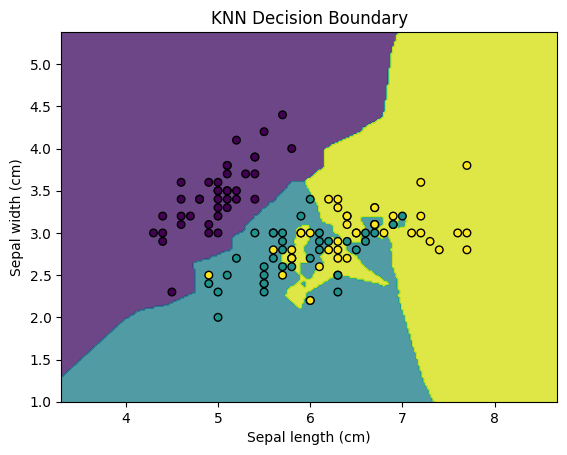

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Load the Iris dataset
iris = load_iris()
X = iris.data[:, :2]
y = iris.target

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create KNN classifier with k=3
knn = KNeighborsClassifier(n_neighbors=3)

# Fit the classifier on the training data
knn.fit(X_train, y_train)

# Make predictions on the test data
y_pred = knn.predict(X_test)

# Calculate the accuracy of the model
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

# Generate a classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

# Generate a confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
print("\nConfusion Matrix:")
print(conf_matrix)

# Plot the decision boundary
def plot_decision_boundary(clf, X, y):
    h = .02  # Step size in the mesh
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1

    xx, yy = np.meshgrid(np.arange(x_min, x_max, h), np.arange(y_min, y_max, h))
    Z = clf.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)
    plt.contourf(xx, yy, Z, alpha=0.8)
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors='k', s=30)
    plt.xlabel('Sepal length (cm)')
    plt.ylabel('Sepal width (cm)')
    plt.title('KNN Decision Boundary')
    plt.show()

# Plot the decision boundary
plot_decision_boundary(knn, X_train[:, :2], y_train)


In [ ]:
df=pd.DataFrame(X)
df

,0,1
0,5.1,3.5
1,4.9,3.0
2,4.7,3.2
3,4.6,3.1
4,5.0,3.6
...,...,...
145,6.7,3.0
146,6.3,2.5
147,6.5,3.0
148,6.2,3.4


Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
df=pd.read_csv("Cleaned_CDR_data.csv")
df

,Phone Number,Account Length,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn,Local call minutes,Local call charge,Local call count
0,382-4657,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,707.2,72.86,300
1,371-7191,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,611.5,55.54,329
2,358-1921,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,527.2,59.00,328
3,375-9999,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,558.2,65.02,248
4,330-6626,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,501.9,49.36,356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7462,989-7856,222,0,223.2,226,20.23,229.3,92,22.29,222.0,36,20.22,23.6,3,3.62,3,True,674.5,62.74,354
7463,797-6875,29,0,232.2,93,22.90,239.2,63,26.22,222.2,223,9.96,22.3,3,3.29,2,False,693.6,59.08,379
7464,979-9576,63,0,232.2,32,39.29,233.2,33,23.02,292.3,223,3.62,9.6,2,2.39,3,False,757.7,65.93,288
7465,778-7577,23,0,230.3,209,30.22,233.3,33,22.33,292.9,92,3.62,22.2,6,3.32,2,False,756.5,56.17,334


In [ ]:
df.columns

Index(['Phone Number', 'Account Length', 'VMail Message', 'Day Mins',
       'Day Calls', 'Day Charge', 'Eve Mins', 'Eve Calls', 'Eve Charge',
       'Night Mins', 'Night Calls', 'Night Charge', 'Intl Mins', 'Intl Calls',
       'Intl Charge', 'CustServ Calls', 'Churn', 'Local call minutes',
       'Local call charge', 'Local call count'],
      dtype='object')

In [ ]:
df.rename(columns={"Phone Number":"Phone_Number"}, inplace=True)

In [ ]:
df.rename(columns={"Phone_Number":"Phone Number"},inplace=True)

In [ ]:
df


,Phone Number,Account Length,VMail Message,Day Mins,Day Calls,Day Charge,Eve Mins,Eve Calls,Eve Charge,Night Mins,Night Calls,Night Charge,Intl Mins,Intl Calls,Intl Charge,CustServ Calls,Churn,Local call minutes,Local call charge,Local call count
0,382-4657,128,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False,707.2,72.86,300
1,371-7191,107,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False,611.5,55.54,329
2,358-1921,137,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False,527.2,59.00,328
3,375-9999,84,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False,558.2,65.02,248
4,330-6626,75,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False,501.9,49.36,356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7462,989-7856,222,0,223.2,226,20.23,229.3,92,22.29,222.0,36,20.22,23.6,3,3.62,3,True,674.5,62.74,354
7463,797-6875,29,0,232.2,93,22.90,239.2,63,26.22,222.2,223,9.96,22.3,3,3.29,2,False,693.6,59.08,379
7464,979-9576,63,0,232.2,32,39.29,233.2,33,23.02,292.3,223,3.62,9.6,2,2.39,3,False,757.7,65.93,288
7465,778-7577,23,0,230.3,209,30.22,233.3,33,22.33,292.9,92,3.62,22.2,6,3.32,2,False,756.5,56.17,334


In [ ]:
import numpy as np
import pandas as pd

# Generate random data for the dataset
np.random.seed(42)
num_customers = 10000

customer_ids = np.arange(1, num_customers + 1)
ages = np.random.randint(18, 70, num_customers)
monthly_usage = np.random.randint(50, 1000, num_customers)

# Create a list of plan types to choose from
plan_types = ['Basic', 'Premium', 'Standard']

# Generate random plan types for each customer
plan_choices = np.random.choice(plan_types, num_customers)

# Create the DataFrame
data = {
    'CustomerID': customer_ids,
    'Age': ages,
    'MonthlyUsage': monthly_usage,
    'PlanType': plan_choices
}

df = pd.DataFrame(data)



In [ ]:
df

,CustomerID,Age,MonthlyUsage,PlanType
0,1,56,788,Premium
1,2,69,932,Basic
2,3,46,64,Basic
3,4,32,241,Premium
4,5,60,680,Premium
...,...,...,...,...
995,996,60,273,Premium
996,997,64,880,Basic
997,998,62,461,Basic
998,999,35,621,Premium


import numpy as np
from google.colab import autoviz
df_2794927998952359660 = autoviz.get_df('df_2794927998952359660')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_2794927998952359660, *['CustomerID'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4310727934884485362 = autoviz.get_df('df_4310727934884485362')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_4310727934884485362, *['Age'], **{})
chart

import numpy as np
from google.colab import autoviz
df_1865266780408039062 = autoviz.get_df('df_1865266780408039062')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_1865266780408039062, *['MonthlyUsage'], **{})
chart

import numpy as np
from google.colab import autoviz
df_7463071758926378925 = autoviz.get_df('df_7463071758926378925')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_7463071758926378925, *['CustomerID'], **{})
chart

import numpy as np
from google.colab import autoviz
df_3948560749661036546 = autoviz.get_df('df_3948560749661036546')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_3948560749661036546, *['Age'], **{})
chart

import numpy as np
from google.colab import autoviz
df_5611477717326526510 = autoviz.get_df('df_5611477717326526510')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_5611477717326526510, *['MonthlyUsage'], **{})
chart

import numpy as np
from google.colab import autoviz
df_3444907765355967968 = autoviz.get_df('df_3444907765355967968')

def categorical_histogram(df, colname, figsize=(2, 1.2), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  _, ax = plt.subplots(figsize=figsize)
  bars = df[colname].value_counts()
  plt.barh(bars.index, bars.values, color=sns.palettes.mpl_palette(mpl_palette_name))
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(df_3444907765355967968, *['PlanType'], **{})
chart

import numpy as np
from google.colab import autoviz
df_5148219190922081845 = autoviz.get_df('df_5148219190922081845')

def scatter_plots(df, colname_pairs, scatter_plot_size=2.5, size=8, alpha=.6):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * scatter_plot_size, scatter_plot_size))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    ax.scatter(df[x_colname], df[y_colname], s=size, alpha=alpha)
    plt.xlabel(x_colname)
    plt.ylabel(y_colname)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df_5148219190922081845, *[[['CustomerID', 'Age'], ['Age', 'MonthlyUsage']]], **{})
chart

import numpy as np
from google.colab import autoviz
df_9146728567014032574 = autoviz.get_df('df_9146728567014032574')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_9146728567014032574, *['CustomerID', 'PlanType'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz
df_8422693227389444386 = autoviz.get_df('df_8422693227389444386')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_8422693227389444386, *['Age', 'PlanType'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz
df_743983619117396147 = autoviz.get_df('df_743983619117396147')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_743983619117396147, *['MonthlyUsage', 'PlanType'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz
df_8594107442380994508 = autoviz.get_df('df_8594107442380994508')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_8594107442380994508, *['CustomerID', 'Age', 'PlanType'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4870750622726512544 = autoviz.get_df('df_4870750622726512544')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_4870750622726512544, *['CustomerID', 'MonthlyUsage', 'PlanType'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4562622947790527904 = autoviz.get_df('df_4562622947790527904')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_4562622947790527904, *['CustomerID', 'count()', 'PlanType'], **{})
chart

In [ ]:
from sklearn.preprocessing import LabelEncoder

labelencoder=LabelEncoder()
df["PlanType"]=labelencoder.fit_transform(df["PlanType"])
df["PlanType"].values


array([1, 0, 0, 1, 1, 2, 0, 1, 0, 1, 1, 0, 1, 1, 2, 1, 1, 1, 2, 0, 2, 2,
       0, 2, 0, 2, 0, 1, 2, 2, 2, 2, 1, 2, 1, 1, 1, 1, 0, 0, 2, 0, 0, 2,
       2, 2, 0, 0, 2, 1, 2, 1, 1, 2, 2, 2, 0, 1, 0, 0, 2, 0, 2, 1, 2, 0,
       0, 2, 2, 0, 1, 1, 2, 1, 0, 2, 0, 0, 1, 2, 2, 1, 0, 0, 0, 0, 2, 2,
       1, 1, 2, 2, 0, 0, 1, 2, 1, 2, 0, 1, 1, 2, 0, 1, 0, 1, 0, 2, 1, 1,
       0, 0, 1, 2, 0, 0, 0, 1, 1, 1, 1, 2, 2, 1, 2, 0, 0, 0, 1, 0, 2, 1,
       2, 0, 0, 0, 1, 2, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1,
       2, 1, 1, 2, 1, 1, 1, 1, 2, 1, 1, 2, 0, 2, 0, 2, 2, 1, 0, 1, 0, 2,
       2, 0, 1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 0, 1, 1, 2,
       1, 1, 2, 0, 0, 0, 2, 1, 2, 2, 1, 0, 0, 2, 0, 2, 2, 1, 1, 1, 2, 1,
       0, 0, 2, 2, 1, 2, 2, 0, 0, 1, 2, 2, 0, 2, 0, 1, 0, 2, 1, 0, 0, 1,
       1, 0, 2, 0, 1, 0, 1, 1, 2, 1, 1, 2, 1, 2, 2, 1, 1, 0, 2, 0, 1, 0,
       2, 0, 2, 1, 1, 2, 1, 1, 1, 1, 2, 0, 0, 1, 0, 0, 1, 1, 0, 2, 1, 2,
       0, 1, 2, 1, 0, 2, 0, 0, 1, 2, 0, 0, 2, 0, 0,

In [ ]:
import numpy as np
import pandas as pd

# Generate random data for the dataset
np.random.seed(42)
num_customers = 10000

customer_ids = np.arange(1, num_customers + 1)
ages = np.random.randint(18, 70, num_customers)
monthly_usage = np.random.randint(50, 1000, num_customers)

# Create a list of plan types to choose from
plan_types = ['Basic', 'Premium', 'Standard']

# Generate random plan types for each customer
plan_choices = np.random.choice(plan_types, num_customers)

# Create the DataFrame
data = {
    'CustomerID': customer_ids,
    'Age': ages,
    'MonthlyUsage': monthly_usage,
    'PlanType': plan_choices
}

df = pd.DataFrame(data)

df



,CustomerID,Age,MonthlyUsage,PlanType
0,1,56,764,Premium
1,2,69,263,Standard
2,3,46,807,Basic
3,4,32,73,Standard
4,5,60,370,Basic
...,...,...,...,...
9995,9996,55,681,Standard
9996,9997,51,232,Basic
9997,9998,57,472,Basic
9998,9999,64,58,Basic


In [ ]:
# Separate the features (X) and the target variable (y)
X = df.drop('PlanType', axis=1)  # Drop one of the dummy variables to avoid multicollinearity
y = df['PlanType']



In [ ]:
X.head()

,CustomerID,Age,MonthlyUsage
0,1,56,764
1,2,69,263
2,3,46,807
3,4,32,73
4,5,60,370


In [ ]:
y.head()

0     Premium
1    Standard
2       Basic
3    Standard
4       Basic
Name: PlanType, dtype: object

In [ ]:
# Encode the target variable to numeric labels (0, 1, 2)
label_mapping = {'Premium': 0, 'Basic': 1, 'Standard': 2}
y = y.map(label_mapping)


In [ ]:
y.head()

0    0
1    2
2    1
3    2
4    1
Name: PlanType, dtype: int64

<ipython-input-52-def2211d9dc8>:4: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  correlation_matrix = df.corr()


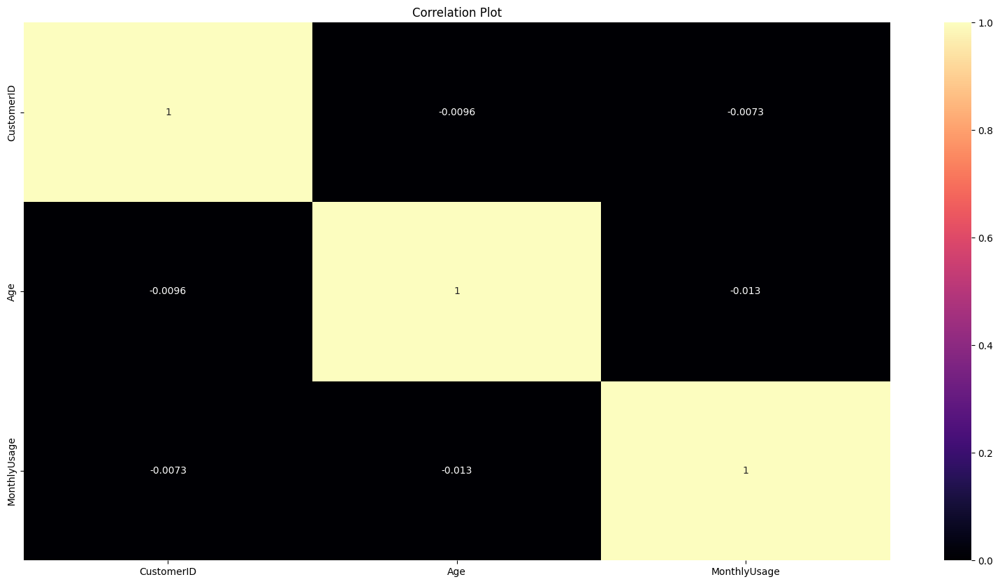

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
# Calculate the correlation matrix
correlation_matrix = df.corr()

# Create the correlation plot using seaborn
plt.figure(figsize=(20, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='magma', vmin=0, vmax=1)
plt.title('Correlation Plot')
plt.show()


In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create the Decision Tree Classifier
clf = DecisionTreeClassifier(random_state=42)

# Train the model on the training data
clf.fit(X_train, y_train)

# Make predictions on the test data
y_pred = clf.predict(X_test)

# Evaluate the model's accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Model Accuracy: {accuracy}")


Model Accuracy: 0.3325


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

# Create and train the logistic regression model
model = LogisticRegression(multi_class='ovr', max_iter=100)
model.fit(X_train, y_train)

# Make predictions on the test data
y_pred = model.predict(X_test)

# Convert the numeric predictions back to original class labels
y_pred_labels = pd.Series(y_pred).map({v: k for k, v in label_mapping.items()})

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")



Accuracy: 0.35


In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report


def knnn(n):


  # Create and train the kNN classifier
  knn = KNeighborsClassifier(n_neighbors=n)
  knn.fit(X_train, y_train)

  # Make predictions on the test data
  y_pred = knn.predict(X_test)

  # Evaluate the model
  accuracy = accuracy_score(y_test, y_pred)
  print(f"Accuracy: {accuracy*100:.2f} :", n)




In [ ]:
for n in range(1,10):
  knnn(n)

Accuracy: 33.45 : 1
Accuracy: 33.95 : 2
Accuracy: 35.75 : 3
Accuracy: 33.50 : 4
Accuracy: 33.40 : 5
Accuracy: 33.35 : 6
Accuracy: 34.20 : 7
Accuracy: 33.05 : 8
Accuracy: 32.20 : 9


In [ ]:
import numpy as np
import pandas as pd
from sklearn.datasets import load_iris
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report


# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create and train the SVM classifier
svm = SVC(kernel='linear', C=1.0, decision_function_shape='ovr')
svm.fit(X_train, y_train)

# Make predictions on the test data
y_pred = svm.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")



Accuracy: 0.42


In [ ]:
!pip install tensorflow

In [ ]:
# import numpy as np
# import pandas as pd
# from sklearn.model_selection import train_test_split
# from sklearn.preprocessing import LabelEncoder
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import accuracy_score

# # Data Preprocessing
# label_encoder = LabelEncoder()
# df['PlanType_encoded'] = label_encoder.fit_transform(df['PlanType'])
# X = df[['Age', 'MonthlyUsage']]
# y = df['PlanType_encoded']

# # Split the data into training and testing sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# # Model Selection and Training
# model = LogisticRegression()
# model.fit(X_train, y_train)

# # Model Evaluation
# y_pred = model.predict(X_test)
# accuracy = accuracy_score(y_test, y_pred)
# print("Accuracy:", accuracy)

# # Example Prediction
# new_data = pd.DataFrame({'Age': [30, 50, 25], 'MonthlyUsage': [500, 200, 800]})
# new_pred = model.predict(new_data)
# predicted_plan_types = label_encoder.inverse_transform(new_pred)
# print("Predicted Plan Types:", predicted_plan_types)


Accuracy: 0.41
Predicted Plan Types: ['Premium' 'Basic' 'Standard']


In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from keras.models import Sequential
from keras.layers import Dense
from keras.utils import to_categorical

# Data Preprocessing
label_encoder = LabelEncoder()
df['PlanType_encoded'] = label_encoder.fit_transform(df['PlanType'])
X = df[['Age', 'MonthlyUsage']].values
y = to_categorical(df['PlanType_encoded'])  # One-hot encode the target variable

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Build the Neural Network
model = Sequential()
model.add(Dense(64, activation='sigmoid', input_shape=(2,)))
model.add(Dense(32, activation='sigmoid'))
model.add(Dense(3, activation='softmax'))  # Output layer with 3 units for 3 classes

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.1)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", accuracy)

# Example Prediction
new_data = np.array([[30, 500], [50, 200], [25, 800]])
predictions = model.predict(new_data)
predicted_plan_types = [plan_types[np.argmax(pred)] for pred in predictions]
print("Predicted Plan Types:", predicted_plan_types)


NameError: ignored

In [ ]:
from tensorflow.keras.datasets import imdb
(train_data, train_labels), (test_data, test_labels) = imdb.load_data(
    num_words=10000)

In [ ]:
print(train_data[0],train_labels[0])

[1, 14, 22, 16, 43, 530, 973, 1622, 1385, 65, 458, 4468, 66, 3941, 4, 173, 36, 256, 5, 25, 100, 43, 838, 112, 50, 670, 2, 9, 35, 480, 284, 5, 150, 4, 172, 112, 167, 2, 336, 385, 39, 4, 172, 4536, 1111, 17, 546, 38, 13, 447, 4, 192, 50, 16, 6, 147, 2025, 19, 14, 22, 4, 1920, 4613, 469, 4, 22, 71, 87, 12, 16, 43, 530, 38, 76, 15, 13, 1247, 4, 22, 17, 515, 17, 12, 16, 626, 18, 2, 5, 62, 386, 12, 8, 316, 8, 106, 5, 4, 2223, 5244, 16, 480, 66, 3785, 33, 4, 130, 12, 16, 38, 619, 5, 25, 124, 51, 36, 135, 48, 25, 1415, 33, 6, 22, 12, 215, 28, 77, 52, 5, 14, 407, 16, 82, 2, 8, 4, 107, 117, 5952, 15, 256, 4, 2, 7, 3766, 5, 723, 36, 71, 43, 530, 476, 26, 400, 317, 46, 7, 4, 2, 1029, 13, 104, 88, 4, 381, 15, 297, 98, 32, 2071, 56, 26, 141, 6, 194, 7486, 18, 4, 226, 22, 21, 134, 476, 26, 480, 5, 144, 30, 5535, 18, 51, 36, 28, 224, 92, 25, 104, 4, 226, 65, 16, 38, 1334, 88, 12, 16, 283, 5, 16, 4472, 113, 103, 32, 15, 16, 5345, 19, 178, 32] 1


In [ ]:
max([max(sequence) for sequence in train_data])

9999

In [ ]:
word_index = imdb.get_word_index()
reverse_word_index = dict(
    [(value, key) for (key, value) in word_index.items()])
decoded_review = " ".join(
    [reverse_word_index.get(i - 3, "?") for i in train_data[0]])

1641221/1641221 [==============================] - 0s 0us/step


In [ ]:
import numpy as np
def vectorize_sequences(sequences, dimension=10000):
    results = np.zeros((len(sequences), dimension))
    for i, sequence in enumerate(sequences):
        for j in sequence:
            results[i, j] = 1.
    return results
x_train = vectorize_sequences(train_data)
x_test = vectorize_sequences(test_data)

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import numpy as np

data=pd.read_csv("Cleaned_CDR_data.csv")

# Define X (feature matrix) and y (target column)
df=data.drop("Phone Number",axis=1)

X = df.drop('Churn', axis=1)
y = df['Churn']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense

# Load and preprocess your dataset (X and y)
# Assuming your dataset is loaded into X and y
# X should have shape (number of samples, 18) and y should have shape (number of samples,)

# Split the data into training and testing sets

# Build the Neural Network
model = Sequential()
model.add(Dense(2048, activation='sigmoid', input_shape=(18,)))
model.add(Dense(1024, activation='sigmoid'))
model.add(Dense(512, activation='relu'))
model.add(Dense(1, activation='sigmoid'))# Output layer with 1 unit for binary classification

# Compile the model
model.compile(optimizer='nadam', loss='binary_crossentropy', metrics=['accuracy'])

# Train the model
model.fit(X_train, y_train, epochs=10, batch_size=32, validation_split=0.1)

# Evaluate the model
loss, accuracy = model.evaluate(X_test, y_test)
print("Test Accuracy:", accuracy)


Epoch 1/10
168/168 [==============================] - 21s 82ms/step - loss: 0.4322 - accuracy: 0.8577 - val_loss: 0.4184 - val_accuracy: 0.8512
Epoch 2/10
168/168 [==============================] - 11s 65ms/step - loss: 0.4118 - accuracy: 0.8577 - val_loss: 0.4202 - val_accuracy: 0.8512
Epoch 3/10
168/168 [==============================] - 10s 58ms/step - loss: 0.4108 - accuracy: 0.8577 - val_loss: 0.4281 - val_accuracy: 0.8512
Epoch 4/10
168/168 [==============================] - 10s 61ms/step - loss: 0.4096 - accuracy: 0.8577 - val_loss: 0.4205 - val_accuracy: 0.8512
Epoch 5/10
168/168 [==============================] - 10s 62ms/step - loss: 0.4116 - accuracy: 0.8577 - val_loss: 0.4220 - val_accuracy: 0.8512
Epoch 6/10
168/168 [==============================] - 11s 64ms/step - loss: 0.4106 - accuracy: 0.8577 - val_loss: 0.4268 - val_accuracy: 0.8512
Epoch 7/10
168/168 [==============================] - 10s 61ms/step - loss: 0.4097 - accuracy: 0.8577 - val_loss: 0.4209 - val_accuracy:

In [ ]:
# Load the dataset
data = pd.read_csv('generated_CDR_dataset.csv')

In [ ]:
data

,CallStart,CallEnd,Duration,CallerNumber,RecipientNumber,CallType,CallStatus,CallCost,CallLocation,Roaming,CallHandover,CallQuality,CallID,DeviceType,FraudActivity
0,2022-01-31 15:49:00,2022-01-12 01:07:00,364,5965473531,4072103018,Data,Busy,1.75,CellTower9,Yes,Yes,Excellent,1,FeaturePhone,1
1,2022-01-17 22:11:00,2022-01-20 19:53:00,71,7592874130,3170649266,SMS,Missed,0.42,CellTower9,No,No,Excellent,2,FeaturePhone,0
2,2022-01-16 15:08:00,2022-01-08 06:10:00,147,3543308132,4356923202,Voice,Busy,0.39,CellTower4,Yes,No,Good,3,Smartphone,0
3,2022-01-13 22:47:00,2022-01-24 18:07:00,75,8829321919,9856555540,Data,Missed,2.38,CellTower8,No,No,Excellent,4,FeaturePhone,1
4,2022-01-14 03:15:00,2022-01-30 02:33:00,321,8295407939,1999582015,SMS,Busy,1.80,CellTower4,No,Yes,Excellent,5,Tablet,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,2022-01-16 18:53:00,2022-01-15 08:24:00,267,4528741977,8088512954,SMS,Busy,1.56,CellTower10,No,Yes,Excellent,996,FeaturePhone,1
996,2022-01-05 03:37:00,2022-01-18 11:37:00,402,1393134028,4495791905,Voice,Missed,0.21,CellTower1,Yes,No,Good,997,Tablet,0
997,2022-01-26 15:09:00,2022-01-12 10:02:00,416,2649412190,8931020362,SMS,Busy,0.28,CellTower7,Yes,Yes,Good,998,FeaturePhone,1
998,2022-01-19 05:10:00,2022-01-15 03:16:00,134,5644970909,3647507020,SMS,Answered,1.37,CellTower6,No,Yes,Good,999,Smartphone,0


import numpy as np
from google.colab import autoviz
df_5615231812640050539 = autoviz.get_df('df_5615231812640050539')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_5615231812640050539, *['Duration'], **{})
chart

import numpy as np
from google.colab import autoviz
df_721223553987521245 = autoviz.get_df('df_721223553987521245')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_721223553987521245, *['CallerNumber'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4626798599775369369 = autoviz.get_df('df_4626798599775369369')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_4626798599775369369, *['RecipientNumber'], **{})
chart

import numpy as np
from google.colab import autoviz
df_7780336265631117601 = autoviz.get_df('df_7780336265631117601')

def value_plot(df, y, sort_ascending=False, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  if sort_ascending:
    df = df.sort_values(y).reset_index(drop=True)
  _, ax = plt.subplots(figsize=figsize)
  df[y].plot(kind='line')
  plt.title(y)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(df_7780336265631117601, *['CallCost'], **{})
chart

import numpy as np
from google.colab import autoviz
df_5554224339199329982 = autoviz.get_df('df_5554224339199329982')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_5554224339199329982, *['Duration'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8677279749370415385 = autoviz.get_df('df_8677279749370415385')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_8677279749370415385, *['CallerNumber'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6487826534901752919 = autoviz.get_df('df_6487826534901752919')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_6487826534901752919, *['RecipientNumber'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8123795396136705598 = autoviz.get_df('df_8123795396136705598')

def histogram(df, colname, num_bins=20, figsize=(2, 1)):
  from matplotlib import pyplot as plt
  _, ax = plt.subplots(figsize=figsize)
  plt.hist(df[colname], bins=num_bins, histtype='stepfilled')
  plt.ylabel('count')
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(df_8123795396136705598, *['CallCost'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6827573692960065883 = autoviz.get_df('df_6827573692960065883')

def categorical_histogram(df, colname, figsize=(2, 1.2), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  _, ax = plt.subplots(figsize=figsize)
  bars = df[colname].value_counts()
  plt.barh(bars.index, bars.values, color=sns.palettes.mpl_palette(mpl_palette_name))
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(df_6827573692960065883, *['CallType'], **{})
chart

import numpy as np
from google.colab import autoviz
df_7774201051057764599 = autoviz.get_df('df_7774201051057764599')

def categorical_histogram(df, colname, figsize=(2, 1.2), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  _, ax = plt.subplots(figsize=figsize)
  bars = df[colname].value_counts()
  plt.barh(bars.index, bars.values, color=sns.palettes.mpl_palette(mpl_palette_name))
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(df_7774201051057764599, *['CallStatus'], **{})
chart

import numpy as np
from google.colab import autoviz
df_1761840096481344462 = autoviz.get_df('df_1761840096481344462')

def categorical_histogram(df, colname, figsize=(2, 1.2), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  _, ax = plt.subplots(figsize=figsize)
  bars = df[colname].value_counts()
  plt.barh(bars.index, bars.values, color=sns.palettes.mpl_palette(mpl_palette_name))
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(df_1761840096481344462, *['Roaming'], **{})
chart

import numpy as np
from google.colab import autoviz
df_7295715955306792693 = autoviz.get_df('df_7295715955306792693')

def categorical_histogram(df, colname, figsize=(2, 1.2), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  _, ax = plt.subplots(figsize=figsize)
  bars = df[colname].value_counts()
  plt.barh(bars.index, bars.values, color=sns.palettes.mpl_palette(mpl_palette_name))
  plt.title(colname)
  ax.spines[['top', 'right',]].set_visible(False)
  return autoviz.MplChart.from_current_mpl_state()

chart = categorical_histogram(df_7295715955306792693, *['CallHandover'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6894369679207398774 = autoviz.get_df('df_6894369679207398774')

def scatter_plots(df, colname_pairs, scatter_plot_size=2.5, size=8, alpha=.6):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * scatter_plot_size, scatter_plot_size))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    ax.scatter(df[x_colname], df[y_colname], s=size, alpha=alpha)
    plt.xlabel(x_colname)
    plt.ylabel(y_colname)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(df_6894369679207398774, *[[['Duration', 'CallerNumber'], ['CallerNumber', 'RecipientNumber'], ['RecipientNumber', 'CallCost'], ['CallCost', 'CallID']]], **{})
chart

import numpy as np
from google.colab import autoviz
df_2828681894709181852 = autoviz.get_df('df_2828681894709181852')

def heatmap(df, x_colname, y_colname, figsize=(2, 2), mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=figsize)
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(df_2828681894709181852, *['CallType', 'CallStatus'], **{})
chart

import numpy as np
from google.colab import autoviz
df_1023974929172922292 = autoviz.get_df('df_1023974929172922292')

def heatmap(df, x_colname, y_colname, figsize=(2, 2), mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=figsize)
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(df_1023974929172922292, *['CallStatus', 'Roaming'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8810663399288683569 = autoviz.get_df('df_8810663399288683569')

def heatmap(df, x_colname, y_colname, figsize=(2, 2), mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=figsize)
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(df_8810663399288683569, *['Roaming', 'CallHandover'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8726172119454916619 = autoviz.get_df('df_8726172119454916619')

def heatmap(df, x_colname, y_colname, figsize=(2, 2), mpl_palette_name='viridis'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  import pandas as pd
  plt.subplots(figsize=figsize)
  df_2dhist = pd.DataFrame({
      x_label: grp[y_colname].value_counts()
      for x_label, grp in df.groupby(x_colname)
  })
  sns.heatmap(df_2dhist, cmap=mpl_palette_name)
  plt.xlabel(x_colname)
  plt.ylabel(y_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = heatmap(df_8726172119454916619, *['CallHandover', 'CallQuality'], **{})
chart

import numpy as np
from google.colab import autoviz
df_6449390213599570403 = autoviz.get_df('df_6449390213599570403')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_6449390213599570403, *['Duration', 'CallType'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz
df_8137012903492291950 = autoviz.get_df('df_8137012903492291950')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_8137012903492291950, *['Duration', 'CallStatus'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz
df_6513522274941891017 = autoviz.get_df('df_6513522274941891017')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_6513522274941891017, *['Duration', 'Roaming'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz
df_2227476697075375457 = autoviz.get_df('df_2227476697075375457')

def violin_plot(df, value_colname, facet_colname, col_width=.3, col_length=3, mpl_palette_name='Dark2', **kwargs):
  from matplotlib import pyplot as plt
  import seaborn as sns
  plt.figure(figsize=(col_length, col_width * len(df[facet_colname].unique())))
  sns.violinplot(df, x=value_colname, y=facet_colname, palette=mpl_palette_name, **kwargs)
  sns.despine(top=True, right=True, bottom=True, left=True)
  return autoviz.MplChart.from_current_mpl_state()

chart = violin_plot(df_2227476697075375457, *['Duration', 'CallHandover'], **{'inner': 'box'})
chart

import numpy as np
from google.colab import autoviz
df_6224310972221661566 = autoviz.get_df('df_6224310972221661566')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_6224310972221661566, *['CallID', 'Duration', 'CallType'], **{})
chart

import numpy as np
from google.colab import autoviz
df_4811036399624767675 = autoviz.get_df('df_4811036399624767675')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_4811036399624767675, *['CallID', 'Duration', 'CallStatus'], **{})
chart

import numpy as np
from google.colab import autoviz
df_8035047885346053707 = autoviz.get_df('df_8035047885346053707')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_8035047885346053707, *['CallID', 'Duration', 'Roaming'], **{})
chart

import numpy as np
from google.colab import autoviz
df_3832233600806548510 = autoviz.get_df('df_3832233600806548510')

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figsize=(2.5, 1.3), mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(df_3832233600806548510, *['CallID', 'Duration', 'CallHandover'], **{})
chart